In [2]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
data = pd.read_csv('/home/kyomukama/ACE/camonet/ml (NEW)/ML clinical outcomes data 14.02.25 version 2  - new.csv')

In [4]:
data.describe()

,age,Number of sites infected,Number of antibiotics prescribed,organism_isolated,length_hosp_stay
count,595.000000,596.00000,596.000000,596.000000,596.000000
mean,30.183193,1.11745,1.954698,0.652685,22.578859
std,22.922539,0.54043,1.059393,0.679972,39.681067
min,0.000000,0.00000,0.000000,0.000000,0.000000
25%,12.000000,1.00000,1.000000,0.000000,6.000000
50%,28.000000,1.00000,2.000000,1.000000,14.000000
75%,44.000000,1.00000,3.000000,1.000000,27.000000
max,95.000000,3.00000,5.000000,3.000000,744.000000


In [5]:
data.shape

(596, 18)

In [6]:
data.head()

,name_of_rrh,age,sex,Number of sites infected,referral,ward,antib_prior_admi,sympt_dura,hiv_status,intubated,cormobid_condition,antibiotics,Number of antibiotics prescribed,organism_isolated,growth1,Resistance,antib_aft_culture,length_hosp_stay
0,Arua,6.0,Male,1,Yes,Pediatric ward,Unknown,< 1 week,Unknown,Unknown,No,Yes,1,0,No,No,No,12
1,Arua,13.0,Male,2,Yes,Medical ward,Unknown,1- < 2 weeks,Negative,Unknown,No,No,0,0,No,No,No,8
2,Arua,11.0,Male,1,No,Pediatric ward,Unknown,< 1 week,Unknown,Unknown,Yes,Yes,2,0,No,No,No,14
3,Arua,18.0,Male,1,Yes,Surgical ward,Unknown,< 1 week,Unknown,Unknown,No,Yes,2,1,Yes,Yes,No,0
4,Arua,17.0,Female,1,Yes,Maternity ward,Unknown,< 1 week,Positive,Unknown,Yes,Yes,3,1,Yes,Yes,Yes,10


In [7]:
data.columns

Index(['name_of_rrh', 'age', 'sex', 'Number of sites infected', 'referral',
       'ward', 'antib_prior_admi', 'sympt_dura', 'hiv_status', 'intubated',
       'cormobid_condition', 'antibiotics', 'Number of antibiotics prescribed',
       'organism_isolated', 'growth1', 'Resistance', 'antib_aft_culture',
       'length_hosp_stay'],
      dtype='object')

# EDA

In [8]:
data.shape

(596, 18)

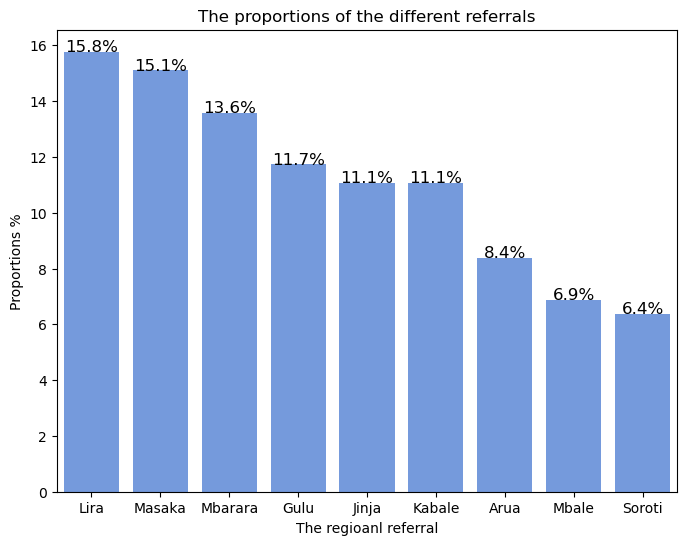

In [9]:
referral_count = data['name_of_rrh'].value_counts(normalize = True) * 100

plt.figure(figsize = (8,6))

ax = sns.barplot(x = referral_count.index, y = referral_count.values, color = 'cornflowerblue')

plt.title("The proportions of the different referrals")
plt.xlabel('The regioanl referral')
plt.ylabel("Proportions %")

# Show percentage values on bars
for i, val in enumerate(referral_count.values):
    plt.text(i, val, f"{val:.1f}%", ha='center', fontsize=12)
    

plt.show()

In [10]:
data['age'].describe()

count    595.000000
mean      30.183193
std       22.922539
min        0.000000
25%       12.000000
50%       28.000000
75%       44.000000
max       95.000000
Name: age, dtype: float64

In [11]:
data[data['age'].isna()].index

Index([564], dtype='int64')

In [12]:
data['age'] = data['age'].fillna(data['age'].median())

Text(0.5, 1.0, 'Age distribution')

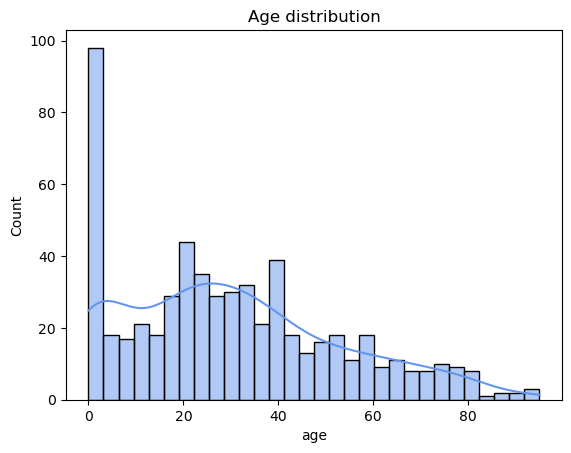

In [13]:
sns.histplot(data, x= 'age', bins = 30, kde = True, color = 'cornflowerblue')

plt.title("Age distribution")

In [14]:
data['sex'].info

<bound method Series.info of 0        Male
1        Male
2        Male
3        Male
4      Female
        ...  
591    Female
592    Female
593    Female
594    Female
595    Female
Name: sex, Length: 596, dtype: object>

/tmp/ipykernel_38276/332617357.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')


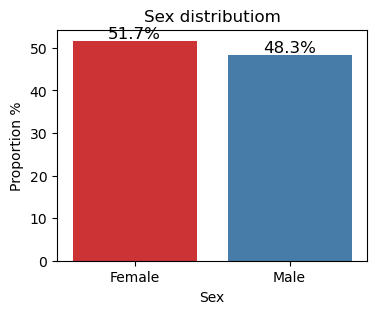

In [15]:
sex_count = data['sex'].value_counts(normalize = True)* 100

plt.figure(figsize = (4,3))

ax =sns.barplot(x = sex_count.index, y = sex_count.values, palette = 'Set1')

plt.title('Sex distributiom')
plt.xlabel('Sex')
plt.ylabel('Proportion %')

# Show percentage values on bars
for i, val in enumerate(sex_count.values):
    plt.text(i, val + 0.5, f"{val:.1f}%", ha='center', fontsize=12)

plt.show()

<Axes: xlabel='name_of_rrh', ylabel='age'>

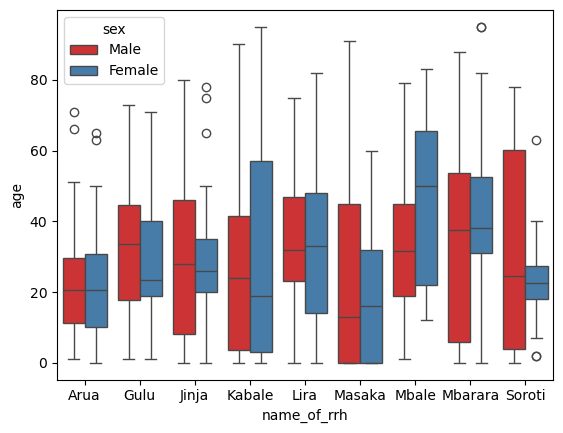

In [16]:
sns.boxplot(data, x= 'name_of_rrh', y = 'age', hue = 'sex', palette= 'Set1')

<Axes: xlabel='name_of_rrh', ylabel='age'>

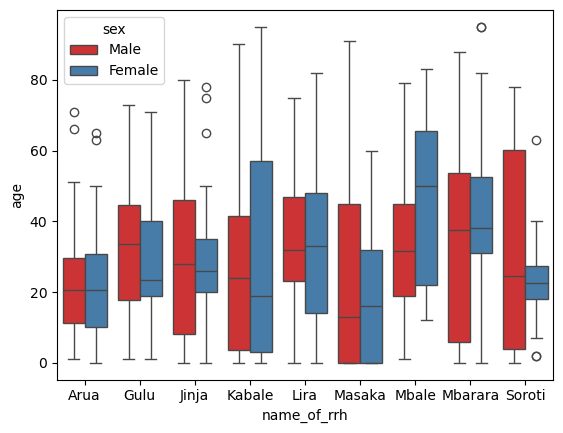

In [17]:
sns.boxplot(data, x= 'name_of_rrh', y = 'age', hue = 'sex', palette= 'Set1')


In [18]:
# infection = pd.melt(
#     data,
#     id_vars = 'ward',
#     value_vars= ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3'],
#     value_name= 'Infections'
# )

# infection.dropna(subset = 'Infections')

# plt.figure(figsize = (8,6))

# infection_count = infection['Infections'].value_counts(normalize = True)* 100

# sns.barplot(x = infection_count.index , y = infection_count.values , color = 'cornflowerblue')

# plt.xticks(rotation = 45, ha = 'right')

# # Show percentage values on bars
# for i, val in enumerate(infection_count.values):
#     plt.text(i, val + 0.5, f"{val:.1f}", ha='center', fontsize=12)

# plt.show()

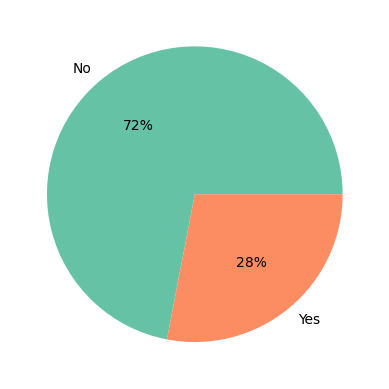

In [19]:
# define Seaborn color palette to use 
palette_color = sns.color_palette('Set2') 
referral_count =  data['referral'].value_counts(normalize = True)*100
  
# plotting data on chart 
plt.pie(referral_count.values, labels= referral_count.index, colors=palette_color, autopct='%.0f%%') 
  
# displaying chart 
plt.show() 

<function matplotlib.pyplot.show(close=None, block=None)>

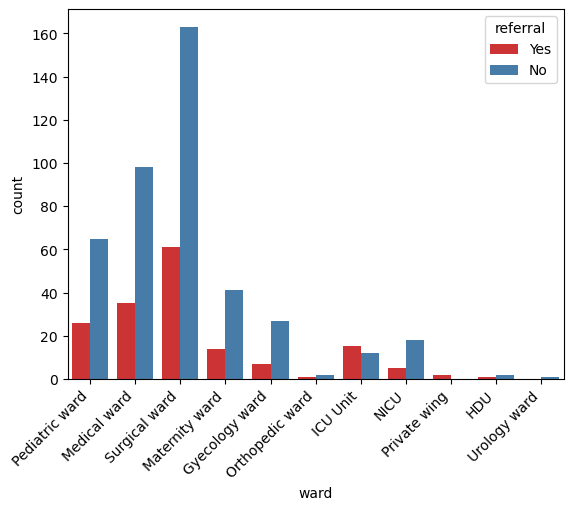

In [20]:
sns.countplot(data, x = 'ward', hue = 'referral', palette = 'Set1')

plt.xticks(rotation = 45, ha ='right')

plt.show

<Axes: xlabel='referral', ylabel='length_hosp_stay'>

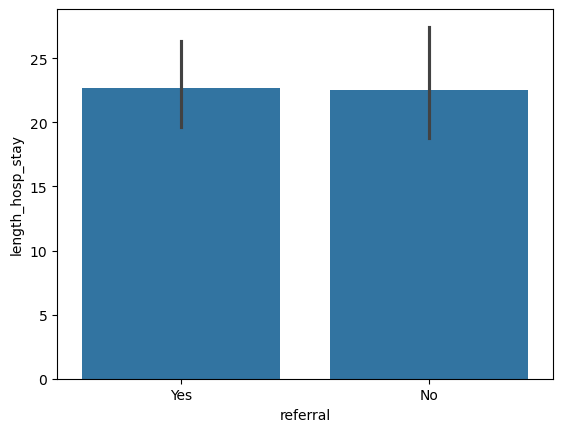

In [21]:
sns.barplot(data, x= 'referral', y = 'length_hosp_stay')

<Axes: xlabel='hiv_status', ylabel='length_hosp_stay'>

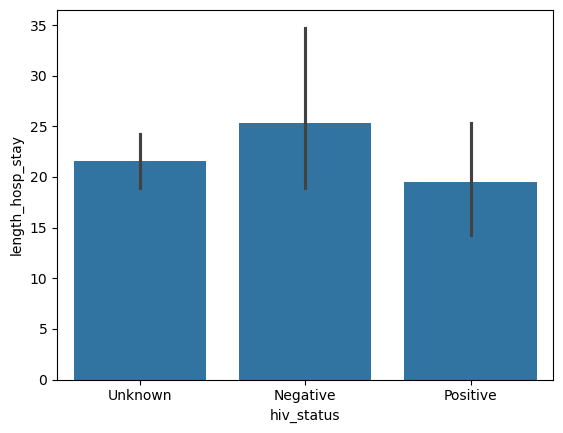

In [22]:
sns.barplot(data, x= 'hiv_status', y = 'length_hosp_stay')

In [23]:
data['intubated'] = data['intubated'].replace({'Unknown': 'No'})

<Axes: xlabel='intubated', ylabel='length_hosp_stay'>

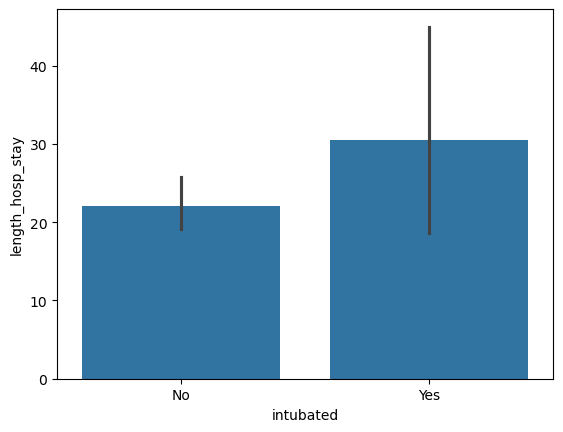

In [24]:
sns.barplot(data, x= 'intubated', y = 'length_hosp_stay')

In [25]:
# def check_prior_antibiotics(row):
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.notna(row[col]):  # Check if the value is not NaN/None
#             return 'Yes'
#     return 'No'


# # Create the new 'Prio_antib' column
# data['Prio_antib'] = data.apply(check_prior_antibiotics, axis=1)

In [26]:
# # drop the other columns of rior antibiotic use

# data.drop(columns = ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4'], inplace = True, axis = 1)

In [27]:
# def resitance_check (row) :
#     if any(row[['Resistance1 ', 'Resistance2', 'Resistance3']] =='Yes'):
#         return 'Yes'
#     else:
#         return 'No'
    
# # Create a new column 'resistance' using the function
# data['resistance'] = data.apply(resitance_check, axis=1)

<Axes: xlabel='Resistance', ylabel='length_hosp_stay'>

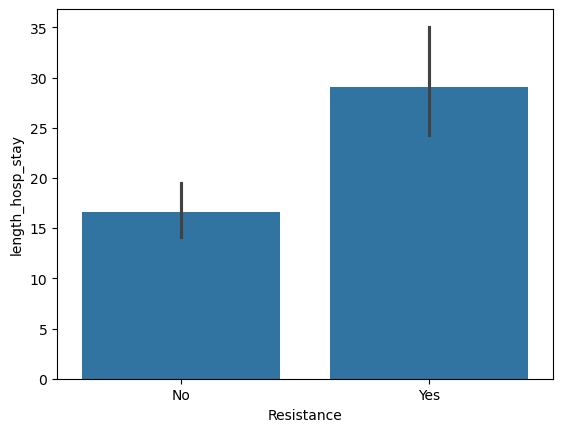

In [28]:
sns.barplot(data, x= 'Resistance', y = 'length_hosp_stay')

In [29]:
#data.drop(columns =['growth1'], inplace= True)

In [30]:
# HDU, ICU , NICU ----- ICU
# Orthopedic, private, urology - medical ward

data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)

/tmp/ipykernel_38276/3353176426.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['ward'].replace({'HDU':'ICU Unit', 'NICU':'ICU Unit', 'Private wing':'Medical ward', 'Gyecology ward':'Medical ward','Urology ward':'Medical ward', 'Orthopedic ward':'Medical ward'}, inplace=True)


In [31]:
# data.drop(columns= ['antib_aft_culture', 'antibiotics'], inplace = True)

# Filling missingness

## Infections sites

In [32]:
# def infection_missing(df) :
#     for col in ['Infection_Site_1', 'Infection_Site_2', 'Infection_Site_3']:
#         if pd.isna(df[col]):
#             df[col] = 'No infection'
#     return df

# data = data.apply(infection_missing, axis = 1)

## Prio antibiotics taken

In [33]:
# def prio_antib_missing(df) :
#     for col in ['Prio_antib_1', 'Prio_antib_2', 'Prio_antib_3', 'Prio_antib_4']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(prio_antib_missing, axis = 1)

## Cormobidity

In [34]:
# def cormobidity_missing(df) :
#     for col in ['Comobidity1', 'Comobidity2', 'Comobidity3']:
#         if pd.isna(df[col]):
#             df[col] = 'UNK'
#     return df

# data = data.apply(cormobidity_missing, axis = 1)

## Antibiotic prescribed

In [35]:
# def Prescribed_antib_missing(df) :
#     for col in ['Prescribed_antib_1', 'Prescribed_antib_2', 'Prescribed_antib_3', 'Prescribed_antib_4', 'Prescribed_antib_5']:
#         if pd.isna(df[col]):
#             df[col] = 'No antibiotic prescribed'
#     return df

# data = data.apply(Prescribed_antib_missing, axis = 1)

## Pathogens

In [36]:
# def pathogen_missing(df) :
#     for col in ['first_organism', 'sec_organism', 'third_organism']:
#         if pd.isna(df[col]):
#             df[col] = 'No pathogen'
#     return df

# data = data.apply(pathogen_missing, axis = 1)

## Antibiotics after culture

In [37]:
# def antib_aft_missing(df) :
#     for col in ['Antibioitic_aft_cul_1', 'Antibioitic_aft_cul_2']:
#         if pd.isna(df[col]):
#             df[col] = 'No antibiotic precibed'
#     return df

# data = data.apply(antib_aft_missing, axis = 1)

## antibiotics

In [38]:
def Antibiotics(df) :
    for col in ['antibiotics']:
        if pd.isna(df[col]):
            df[col] = 'No'
    return df

data = data.apply(Antibiotics, axis = 1)

## antibiotics after culture (Yes/No)

In [39]:
# def Antibiotics_aft(df) :
#     for col in ['antib_aft_culture']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Antibiotics_aft, axis = 1)

## Complications

In [40]:
# def Complications(df) :
#     for col in ['complications']:
#         if pd.isna(df[col]):
#             df[col] = 'No'
#     return df

# data = data.apply(Complications, axis = 1)

## length of hospital stay

In [41]:
# data.dropna(subset = 'length_hosp_stay', inplace = True)

In [42]:
data.isna().sum()

name_of_rrh                         0
age                                 0
sex                                 0
Number of sites infected            0
referral                            0
ward                                0
antib_prior_admi                    0
sympt_dura                          0
hiv_status                          0
intubated                           0
cormobid_condition                  0
antibiotics                         0
Number of antibiotics prescribed    0
organism_isolated                   0
growth1                             0
Resistance                          0
antib_aft_culture                   0
length_hosp_stay                    0
dtype: int64

In [43]:
data.drop(columns = ['growth1'], inplace = True)

# Encoding data

## Label Encoding

In [44]:
from sklearn.preprocessing import LabelEncoder

Le = LabelEncoder()

In [45]:
columns_to_encode = data.drop(columns = ['age', 'length_hosp_stay', 'referral', 'sex', 'intubated', 'Resistance'])

for column in columns_to_encode:
    data[column] = Le.fit_transform(data[column])

## One hot encoding

In [46]:
#sex
data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})

/tmp/ipykernel_38276/1529081699.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['sex'] = data['sex'].replace({'Male': 0, 'Female': 1})


In [47]:
data = data.replace ({'Yes': 1, "No": 0})

/tmp/ipykernel_38276/2147984969.py:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data = data.replace ({'Yes': 1, "No": 0})


In [48]:
data.tail()

,name_of_rrh,age,sex,Number of sites infected,referral,ward,antib_prior_admi,sympt_dura,hiv_status,intubated,cormobid_condition,antibiotics,Number of antibiotics prescribed,organism_isolated,Resistance,antib_aft_culture,length_hosp_stay
591,8,2.0,1,1,0,3,1,2,0,0,0,1,1,0,0,0,10
592,8,27.0,1,1,0,1,2,2,0,0,0,1,1,1,1,0,3
593,8,20.0,1,1,0,1,1,2,0,0,0,1,2,0,0,0,6
594,8,24.0,1,1,1,1,1,4,2,0,0,1,1,0,0,0,8
595,8,2.0,1,1,0,3,1,2,2,0,0,1,2,1,1,1,21


# Correlation 

Correaltion with the target variable and also how the different variable correlate with each other

/tmp/ipykernel_38276/1964570330.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')


Index(['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex'],
      dtype='object')


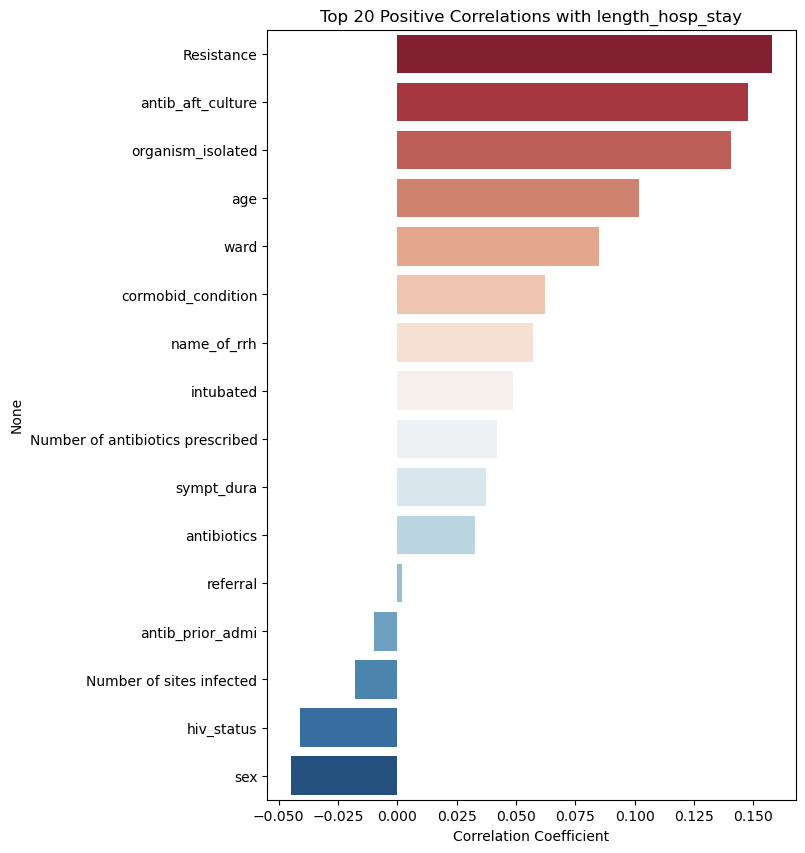

In [49]:
def plot_correlations(df, target_column, n_top = 39):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]

    print(top_corr.index)
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Plot 1: Horizontal bar chart of top correlations
    plt.subplot(1, 2, 1)
    sns.barplot(x=top_corr.values, y=top_corr.index, palette='RdBu')
    plt.title(f'Top {n_top} Positive Correlations with {target_column}')
    plt.xlabel('Correlation Coefficient')

plot_correlations(data, 'length_hosp_stay', n_top=20)


<Figure size 1500x1000 with 0 Axes>

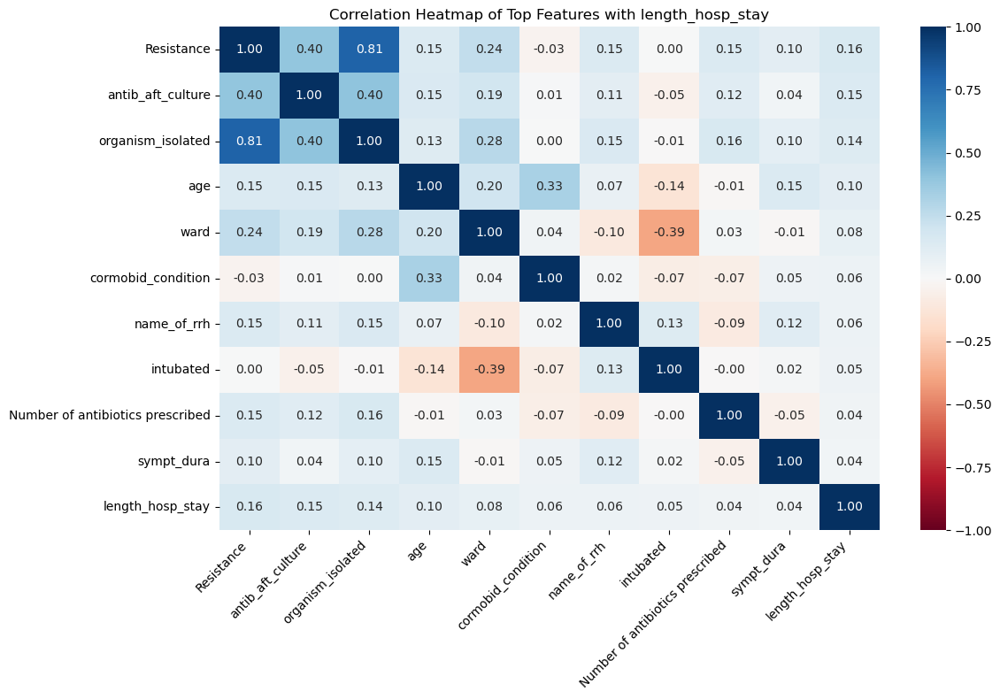

In [50]:
def plot_correlations(df, target_column, n_top=20):
    
    # Calculate correlations with target variable
    correlations = df.corr()[target_column].sort_values(ascending=False)
    
    # Get top N most correlated features (excluding the target itself)
    top_corr = correlations[1:n_top+1]
    #bottom_corr = correlations[-(n_top):]
    
    # Create figure with two subplots
    plt.figure(figsize=(15, 10))
    
    # Create heatmap of top correlated features
    plt.figure(figsize=(12, 8))
    top_features = list(top_corr.index[:10]) + [target_column]  # Top 10 + target
    correlation_matrix = df[top_features].corr()
    
    sns.heatmap(correlation_matrix, 
                annot=True,
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0,
                fmt='.2f')
    plt.title(f'Correlation Heatmap of Top Features with {target_column}')
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

plot_correlations(data, 'length_hosp_stay', n_top=20)

# ML

## Data

In [51]:
print(data.shape)

data.head()

(596, 17)


,name_of_rrh,age,sex,Number of sites infected,referral,ward,antib_prior_admi,sympt_dura,hiv_status,intubated,cormobid_condition,antibiotics,Number of antibiotics prescribed,organism_isolated,Resistance,antib_aft_culture,length_hosp_stay
0,0,6.0,0,1,1,3,1,2,2,0,0,1,1,0,0,0,12
1,0,13.0,0,2,1,2,1,0,0,0,0,0,0,0,0,0,8
2,0,11.0,0,1,0,3,1,2,2,0,1,1,2,0,0,0,14
3,0,18.0,0,1,1,4,1,2,2,0,0,1,2,1,1,0,0
4,0,17.0,1,1,1,1,1,2,1,0,1,1,3,1,1,1,10


In [52]:
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay']) 

Shapiro-Wilk Test: Statistic=0.9935793320860281, p-value=0.01223393508687798
Log-transformed sample does not look Gaussian (reject H0)


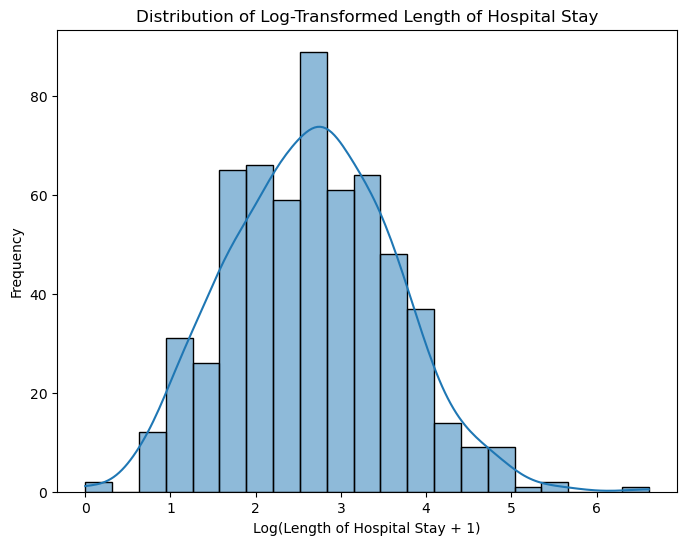

In [53]:
from scipy import stats

# Assuming you have a DataFrame named 'data' with a 'length_hosp_stay' column

# Log transform the 'length_hosp_stay' column
log_length_hosp_stay = np.log1p(data['length_hosp_stay'])

# Visualize the log-transformed data
plt.figure(figsize=(8, 6))
sns.histplot(log_length_hosp_stay, kde=True)
plt.title('Distribution of Log-Transformed Length of Hospital Stay')
plt.xlabel('Log(Length of Hospital Stay + 1)')
plt.ylabel('Frequency')

# Save the plot
plt.savefig("log_length_hosp_stay_distribution.png")

# Perform a normality test (e.g., Shapiro-Wilk)
shapiro_test = stats.shapiro(log_length_hosp_stay)
print(f"Shapiro-Wilk Test: Statistic={shapiro_test.statistic}, p-value={shapiro_test.pvalue}")

# Interpretation (example)
alpha = 0.05  # Significance level
if shapiro_test.pvalue > alpha:
    print("Log-transformed sample looks Gaussian (fail to reject H0)")
else:
    print("Log-transformed sample does not look Gaussian (reject H0)")

# Show the plot
plt.show()


## Modelling

# Huber model

2025/03/11 11:35:14 WARNING mlflow.utils.git_utils: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh(<full-path-to-git-executable>)

All git commands will error until this is rectified.

This initial message can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|silent|none|n|0: for no message or exception
    - warn|w|warning|log|l|1: for a warning message (logging level CRITICAL, displayed by default)
    - error|e|exception|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inf

Mean Absolute Error: 14.46
Root Mean Squared Error: 22.94
R-squared Score: 0.0466


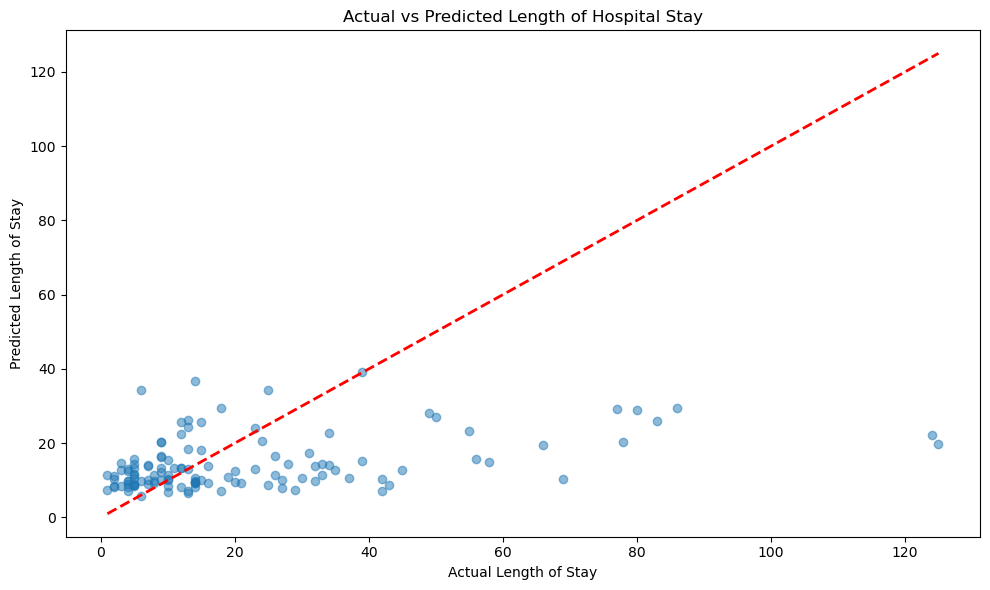

In [54]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# X = data[[
#     'Resistance','referral','antib_prior_admi',
#     'hiv_status', 'organism_isolated',
#     'ward', 'cormobid_condition', 'sympt_dura',
#     'Antibioitic_aft_cul_1', 'Infection_Site_2',
#     'sec_organism', 'Infection_Site_1', 'first_organism',
#     'Prescribed_antib_1', 'name_of_rrh', 'Prescribed_antib_3'
# ]]
# X = data.drop(columns='length_hosp_stay')
# y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
params = {
    'epsilon': 2.0,
    'max_iter': 500,
    'alpha': 0.1
}

# Train the model
huber = HuberRegressor(**params)
huber.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = huber.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(huber, "huber_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

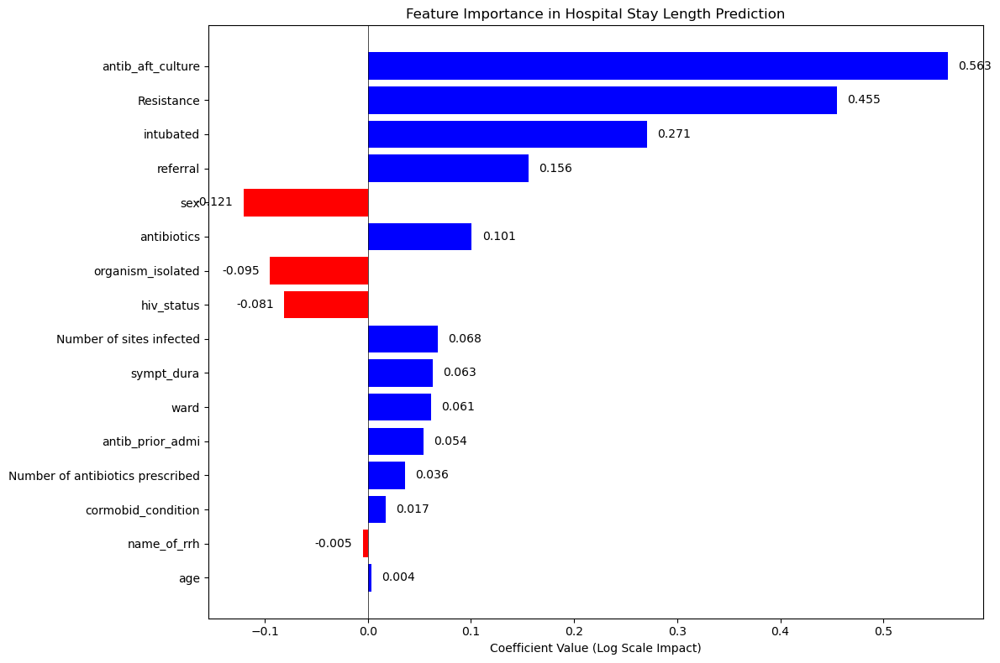


Feature Importance Rankings:
                         feature  coefficient  abs_coefficient
               antib_aft_culture     0.562680         0.562680
                      Resistance     0.455292         0.455292
                       intubated     0.270975         0.270975
                        referral     0.156080         0.156080
                             sex    -0.120729         0.120729
                     antibiotics     0.100838         0.100838
               organism_isolated    -0.094862         0.094862
                      hiv_status    -0.081369         0.081369
        Number of sites infected     0.068022         0.068022
                      sympt_dura     0.062894         0.062894
                            ward     0.061382         0.061382
                antib_prior_admi     0.053769         0.053769
Number of antibiotics prescribed     0.036339         0.036339
              cormobid_condition     0.017014         0.017014
                     name

In [55]:
# Get feature names and coefficients
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': huber.coef_
})

# Sort by absolute value of coefficient while keeping the sign
feature_importance['abs_coef'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coef', ascending=True)

# Create a horizontal bar plot
plt.figure(figsize=(12, 8))
colors = ['red' if c < 0 else 'blue' for c in feature_importance['coefficient']]
bars = plt.barh(feature_importance['feature'], feature_importance['coefficient'], color=colors)

# Add vertical line at x=0
plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)

# Customize the plot
plt.title('Feature Importance in Hospital Stay Length Prediction')
plt.xlabel('Coefficient Value (Log Scale Impact)')

# Add value labels on the bars
for bar in bars:
    width = bar.get_width()
    label_x = width + (0.01 if width >= 0 else -0.01)
    plt.text(label_x, bar.get_y() + bar.get_height()/2, 
             f'{width:.3f}',
             ha='left' if width >= 0 else 'right', 
             va='center')

plt.tight_layout()
plt.show()

# Print detailed feature importance table
feature_importance['abs_coefficient'] = abs(feature_importance['coefficient'])
feature_importance = feature_importance.sort_values('abs_coefficient', ascending=False)
print("\nFeature Importance Rankings:")
print(feature_importance[['feature', 'coefficient', 'abs_coefficient']].to_string(index=False))

# Calculate percentage influence
total_importance = feature_importance['abs_coefficient'].sum()
feature_importance['influence_percentage'] = (feature_importance['abs_coefficient'] / total_importance * 100)

print("\nTop 5 Most Influential Features:")
top_5 = feature_importance.head()
for _, row in top_5.iterrows():
    direction = "increases" if row['coefficient'] > 0 else "decreases"
    print(f"{row['feature']}: {row['influence_percentage']:.1f}% influence ({direction} length of stay)")

In [56]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow huber model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Huber model")

    # Infer the model signature
    signature = infer_signature(X_train, huber.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Huber_model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Huber_model' already exists. Creating a new version of this model...
2025/03/11 11:35:23 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: H

🏃 View run zealous-flea-445 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/ace681c65b634ec1bbcb6c1846c87766
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


Created version '38' of model 'Huber_model'.


In [57]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = data.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Number of sites infected,referral,ward,antib_prior_admi,sympt_dura,hiv_status,intubated,cormobid_condition,antibiotics,Number of antibiotics prescribed,organism_isolated,Resistance,antib_aft_culture,length_hosp_stay,actual_class,predicted_class
188,3,38.0,0,1,0,4,1,0,2,0,0,1,3,0,0,0,NaN,3.044522,2.362303
238,3,2.0,0,2,0,3,1,2,2,0,0,1,1,1,1,0,NaN,1.791759,2.655658
462,6,22.0,1,3,1,1,1,2,0,0,0,1,2,0,0,0,NaN,3.295837,2.530128
465,6,14.0,0,1,0,4,1,3,0,0,1,1,2,1,1,0,NaN,2.772589,2.955033
182,2,25.0,0,1,0,2,2,2,0,0,0,1,3,0,0,0,NaN,1.791759,2.541118
300,4,43.0,1,1,0,4,1,2,1,0,1,1,3,1,1,1,NaN,4.394449,3.401388
101,1,16.0,0,1,1,4,0,0,2,0,0,1,2,1,1,1,NaN,2.564949,3.284044
286,4,12.0,0,1,1,2,1,0,1,0,1,1,1,0,0,0,NaN,2.197225,2.324646
388,5,0.0,0,1,1,0,1,0,0,1,0,1,2,0,0,0,NaN,3.526361,2.526195
566,8,22.0,1,0,0,4,2,3,2,0,0,1,1,2,1,0,NaN,0.693147,2.527116


## Hyperparameter tuning

In [58]:
import optuna

def objective(trial):
    """Function to optimize hyperparameters."""
    with mlflow.start_run():
        # Suggest hyperparameters
        epsilon = trial.suggest_float("epsilon", 1.1, 2.0)
        max_iter = trial.suggest_int("max_iter", 500, 2000, step=500)
        alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
        
        # Train the model
        model = HuberRegressor(epsilon=epsilon, max_iter=max_iter, alpha=alpha)
        model.fit(X_train, y_train)

        # Predict
        y_pred = model.predict(X_test)

        # Compute metric
        mae = mean_absolute_error(y_test, y_pred)
        mse = mean_squared_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        # Log parameters and metrics to MLflow
        mlflow.log_params({"epsilon": epsilon, "max_iter": max_iter, "alpha": alpha})
        mlflow.log_metric("MAE", mae)
        mlflow.log_metric('MSE', mse)
        mlflow.log_metric('R2', r2)

        return mae  # Optuna minimizes this

# Run optimization
study = optuna.create_study(direction="minimize")  # Minimize MAE
study.optimize(objective, n_trials=20)

# Print best parameters
print("Best parameters:", study.best_params)


[I 2025-03-11 11:35:24,244] A new study created in memory with name: no-name-89c5dfb1-9c59-4afa-bbc5-64ed59fa398f
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:24,431] Trial 0 finished with value: 0.7212581980122548 and parameters: {'epsilon': 1.2946553959809899, 'max_iter': 500, 'alpha': 0.0032379924238998556}. Best is trial 0 with value: 0.7212581980122548.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:24,589] Trial 1 finished with value: 0.7153944

🏃 View run bright-bird-496 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/ff9a0a8f46a0444ba46ec3e2505e5f8f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run capable-moose-140 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/9acba114cb654411b564e9afa4f9e7ab
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:24,744] Trial 2 finished with value: 0.7130727378316457 and parameters: {'epsilon': 1.6678553379121865, 'max_iter': 1000, 'alpha': 0.00023222186558072023}. Best is trial 2 with value: 0.7130727378316457.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:24,868] Trial 3 finished with value: 0.7181204459402534 and parameters: {'epsilon': 1.4332528576355448, 'max_iter': 2000, 'alpha': 0.001233810710335831}. Best

🏃 View run hilarious-pug-416 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/d1e088a9ea01453099c9f1fa14d35bb9
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run debonair-sheep-327 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e5d6493af37346379987202b5e6c8895
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:24,998] Trial 4 finished with value: 0.7153739114259599 and parameters: {'epsilon': 1.5592966232064709, 'max_iter': 500, 'alpha': 3.1971292751433544e-05}. Best is trial 2 with value: 0.7130727378316457.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,157] Trial 5 finished with value: 0.7147669654588246 and parameters: {'epsilon': 1.5913662834520912, 'max_iter': 2000, 'alpha': 0.003479765723791141}. Best 

🏃 View run redolent-frog-818 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e972003483c94ea1a10f277a29675e51
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run industrious-dog-94 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/72388b4cf0e447669abf9d30db18fdf8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,308] Trial 6 finished with value: 0.711219227879331 and parameters: {'epsilon': 1.7939007826173272, 'max_iter': 2000, 'alpha': 2.4110871835560835e-05}. Best is trial 6 with value: 0.711219227879331.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,472] Trial 7 finished with value: 0.7183797601030989 and parameters: {'epsilon': 1.4175370998417671, 'max_iter': 500, 'alpha': 0.0051282437382392165}. Best i

🏃 View run clumsy-asp-732 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/712264e0bc5d4eb29bff1e5666a37950
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run glamorous-moth-169 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/a29c427ffb59453ab760f9b979110183
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,599] Trial 8 finished with value: 0.7135257767113868 and parameters: {'epsilon': 1.6421087904988396, 'max_iter': 2000, 'alpha': 1.7771894740977092e-05}. Best is trial 6 with value: 0.711219227879331.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,688] Trial 9 finished with value: 0.7253697881741947 and parameters: {'epsilon': 1.145709740619655, 'max_iter': 1000, 'alpha': 0.00011975756468449343}. Best

🏃 View run handsome-whale-687 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/bbfba7ab283e4be3bdce6afc7df117a6
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run capricious-pig-28 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/3f779ae5ea994dcfbc61c319a31e10b4
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,834] Trial 10 finished with value: 0.7103904127920195 and parameters: {'epsilon': 1.9558523767485463, 'max_iter': 1500, 'alpha': 1.036468940214141e-05}. Best is trial 10 with value: 0.7103904127920195.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:25,993] Trial 11 finished with value: 0.7105654595867056 and parameters: {'epsilon': 1.9573523977909155, 'max_iter': 1500, 'alpha': 1.122443100354716e-05}. B

🏃 View run aged-stork-294 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/c3ee123f734d4ebc86d6b7fa06e02321
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run defiant-gnat-165 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/b5717cacb58b421ab887891a103aa549
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:26,124] Trial 12 finished with value: 0.710481918518172 and parameters: {'epsilon': 1.9953798929157247, 'max_iter': 1500, 'alpha': 1.2038060526272781e-05}. Best is trial 10 with value: 0.7103904127920195.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:26,271] Trial 13 finished with value: 0.7104817177500469 and parameters: {'epsilon': 1.991674863803809, 'max_iter': 1500, 'alpha': 5.397527456084433e-05}. Be

🏃 View run wise-roo-664 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/6cde0b1cb8dc4f1b8cd835ffc71f44c5
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run wise-mule-620 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/eeb48cc0a4be4c2a9809c826cd1c3568
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:26,410] Trial 14 finished with value: 0.7107951398135728 and parameters: {'epsilon': 1.837975084580459, 'max_iter': 1500, 'alpha': 6.341490270331113e-05}. Best is trial 10 with value: 0.7103904127920195.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:26,569] Trial 15 finished with value: 0.7107992976095591 and parameters: {'epsilon': 1.835400797677986, 'max_iter': 1000, 'alpha': 4.553055361110938e-05}. Bes

🏃 View run useful-fox-488 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/cdb0d58fd13144549b9a8e3e05537bb0
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run overjoyed-whale-240 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/0fe9734af7484e12bf883e26550f2878
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:26,739] Trial 16 finished with value: 0.7104780102586986 and parameters: {'epsilon': 1.9234359424333956, 'max_iter': 1500, 'alpha': 0.0005394547943079012}. Best is trial 10 with value: 0.7103904127920195.
/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)


🏃 View run bright-donkey-340 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/a57474b6f54c45289a56e78d72d83829
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


[I 2025-03-11 11:35:26,979] Trial 17 finished with value: 0.7118375439379202 and parameters: {'epsilon': 1.7431414821714022, 'max_iter': 1500, 'alpha': 0.0006136469104412045}. Best is trial 10 with value: 0.7103904127920195.


🏃 View run loud-moose-811 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/a9ab3f187dc043a0ba3cf32e88d14cb2
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:27,214] Trial 18 finished with value: 0.7105616213965142 and parameters: {'epsilon': 1.8965919482466367, 'max_iter': 1000, 'alpha': 0.0006096798622053772}. Best is trial 10 with value: 0.7103904127920195.


🏃 View run debonair-kite-210 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/6ad5b915011949789ae67c49db652e39
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
🏃 View run thoughtful-ant-89 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/2f9bbed11a094157a7e3b57b03168b98
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571


/tmp/ipykernel_38276/1007683687.py:9: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  alpha = trial.suggest_loguniform("alpha", 1e-5, 1e-2)
[I 2025-03-11 11:35:27,424] Trial 19 finished with value: 0.7117827768514462 and parameters: {'epsilon': 1.750265236977599, 'max_iter': 1500, 'alpha': 0.0014562175950990001}. Best is trial 10 with value: 0.7103904127920195.


Best parameters: {'epsilon': 1.9558523767485463, 'max_iter': 1500, 'alpha': 1.036468940214141e-05}


In [59]:
# Load the model back for predictions as a generic Python Function model
loaded_model = mlflow.pyfunc.load_model(model_info.model_uri)

predictions = loaded_model.predict(X_test)

dataset_names = data.columns

result = pd.DataFrame(X_test, columns=dataset_names)
result["actual_class"] = y_test
result["predicted_class"] = predictions

result[:10]

,name_of_rrh,age,sex,Number of sites infected,referral,ward,antib_prior_admi,sympt_dura,hiv_status,intubated,cormobid_condition,antibiotics,Number of antibiotics prescribed,organism_isolated,Resistance,antib_aft_culture,length_hosp_stay,actual_class,predicted_class
188,3,38.0,0,1,0,4,1,0,2,0,0,1,3,0,0,0,NaN,3.044522,2.362303
238,3,2.0,0,2,0,3,1,2,2,0,0,1,1,1,1,0,NaN,1.791759,2.655658
462,6,22.0,1,3,1,1,1,2,0,0,0,1,2,0,0,0,NaN,3.295837,2.530128
465,6,14.0,0,1,0,4,1,3,0,0,1,1,2,1,1,0,NaN,2.772589,2.955033
182,2,25.0,0,1,0,2,2,2,0,0,0,1,3,0,0,0,NaN,1.791759,2.541118
300,4,43.0,1,1,0,4,1,2,1,0,1,1,3,1,1,1,NaN,4.394449,3.401388
101,1,16.0,0,1,1,4,0,0,2,0,0,1,2,1,1,1,NaN,2.564949,3.284044
286,4,12.0,0,1,1,2,1,0,1,0,1,1,1,0,0,0,NaN,2.197225,2.324646
388,5,0.0,0,1,1,0,1,0,0,1,0,1,2,0,0,0,NaN,3.526361,2.526195
566,8,22.0,1,0,0,4,2,3,2,0,0,1,1,2,1,0,NaN,0.693147,2.527116


Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best parameters: {'alpha': 0.1, 'epsilon': 2.0, 'max_iter': 500}
Best cross-validation score (RMSE): 0.9945062117218184

Top 5 parameter combinations:
                                               params      rmse  \
24    {'alpha': 0.1, 'epsilon': 2.0, 'max_iter': 500}  0.994506   
23   {'alpha': 0.1, 'epsilon': 1.75, 'max_iter': 500}  0.994554   
19   {'alpha': 0.05, 'epsilon': 2.0, 'max_iter': 500}  0.994594   
9   {'alpha': 0.005, 'epsilon': 2.0, 'max_iter': 500}  0.994650   
4   {'alpha': 0.001, 'epsilon': 2.0, 'max_iter': 500}  0.994664   

    std_test_score  
24        0.131566  
23        0.138050  
19        0.131575  
9         0.131330  
4         0.131399  


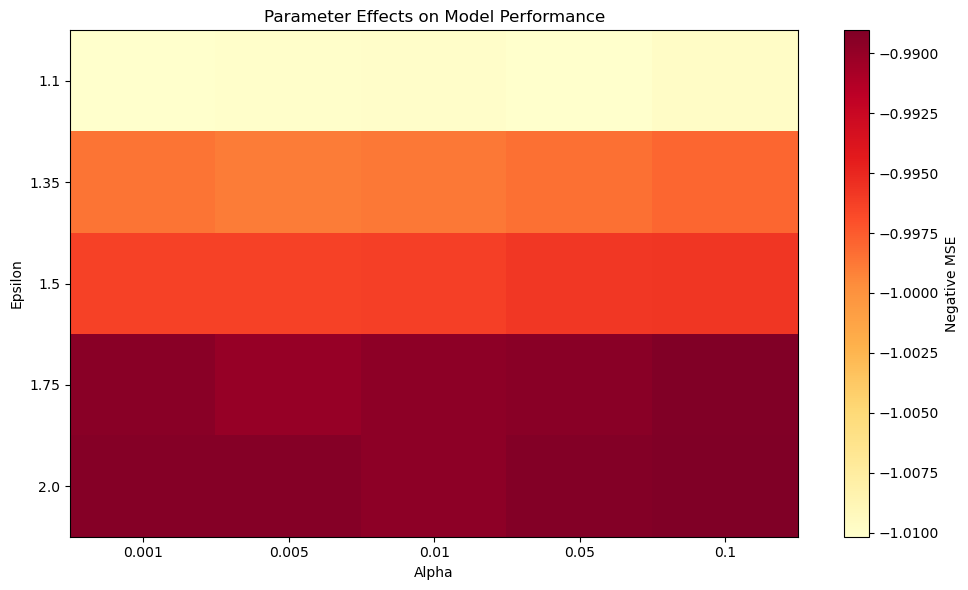


Feature Importances:
                             feature  coefficient
15                 antib_aft_culture     0.595328
14                        Resistance     0.359202
9                          intubated     0.274189
4                           referral     0.197481
2                                sex    -0.115026
8                         hiv_status    -0.076341
5                               ward     0.073433
3           Number of sites infected     0.059788
7                         sympt_dura     0.053360
10                cormobid_condition     0.052665
13                 organism_isolated    -0.051129
12  Number of antibiotics prescribed     0.047623
11                       antibiotics     0.036452
6                   antib_prior_admi     0.023525
1                                age     0.003051
0                        name_of_rrh    -0.001373

Cross-validation RMSE scores:
Mean RMSE: 0.9923 (+/- 0.1324)


In [60]:
from sklearn.model_selection import GridSearchCV

# Prepare the data (using log transform as before)
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])

# Define parameter grid
param_grid = {
    'epsilon': [1.1, 1.35, 1.5, 1.75, 2.0],
    'alpha': [0.001, 0.005, 0.01, 0.05, 0.1],
    'max_iter': [500]  # Fixed as it's more of a computational parameter
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(
    HuberRegressor(),
    param_grid,
    cv=5,
    scoring='neg_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search.fit(X, y)

# Print the best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score (RMSE):", np.sqrt(-grid_search.best_score_))

# Get detailed results
cv_results = pd.DataFrame(grid_search.cv_results_)
cv_results = cv_results.sort_values('rank_test_score')

# Print top 5 parameter combinations
print("\nTop 5 parameter combinations:")
top_5 = cv_results[['params', 'mean_test_score', 'std_test_score']].head()
top_5['rmse'] = np.sqrt(-top_5['mean_test_score'])
print(top_5[['params', 'rmse', 'std_test_score']])

# Plot parameter effects
import matplotlib.pyplot as plt

# Create epsilon vs alpha heatmap
pivot_table = cv_results.pivot_table(
    values='mean_test_score',
    index='param_epsilon',
    columns='param_alpha'
)

plt.figure(figsize=(10, 6))
plt.imshow(pivot_table, cmap='YlOrRd', aspect='auto')
plt.colorbar(label='Negative MSE')
plt.xticks(range(len(param_grid['alpha'])), param_grid['alpha'])
plt.yticks(range(len(param_grid['epsilon'])), param_grid['epsilon'])
plt.xlabel('Alpha')
plt.ylabel('Epsilon')
plt.title('Parameter Effects on Model Performance')
plt.tight_layout()
plt.show()

# Train final model with best parameters
best_model = HuberRegressor(**grid_search.best_params_)
best_model.fit(X, y)

# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'coefficient': best_model.coef_
})
feature_importance = feature_importance.sort_values('coefficient', key=abs, ascending=False)

print("\nFeature Importances:")
print(feature_importance)

# Validate the model using cross-validation scores
from sklearn.model_selection import cross_val_score
cv_scores = cross_val_score(best_model, X, y, cv=5, scoring='neg_mean_squared_error')
rmse_scores = np.sqrt(-cv_scores)

print("\nCross-validation RMSE scores:")
print(f"Mean RMSE: {rmse_scores.mean():.4f} (+/- {rmse_scores.std() * 2:.4f})")

# Random Forest Regressor


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run upset-cat-688 at: http://127.0.0.1:8080/#/experiments/993118495688724571/runs/e80252c793e64288b225fe2f07dddc2e
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/993118495688724571
Mean Absolute Error: 13.82
Root Mean Squared Error: 22.08
R-squared Score: 0.1163


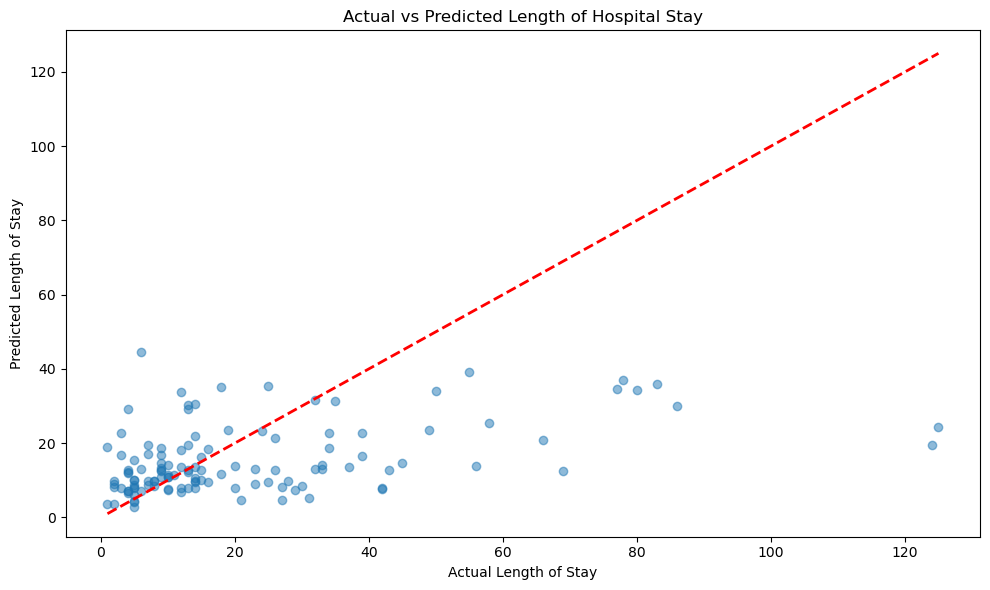

In [61]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
#X = data.drop(columns='length_hosp_stay')
# y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# X = data[[
#     'name_of_rrh', 'age', 'antib_aft_culture', 'Resistance', 
#     'Number of antibiotics prescribed', 'hiv_status', 'ward', 
#     'sympt_dura', 'intubated', 'organism_isolated', 'sex', 
#     'antib_prior_admi', 'referral', 'cormobid_condition', 
#     'Number of sites infected', 'antibiotics'
#     ]]

X = data[['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex']]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters
# Try these parameters
params = {
    'random_state': 42,
    'n_estimators': 1500,  
    'min_samples_split': 12,  
    'min_samples_leaf': 4,  
    'max_features':0.8,  
    'max_depth': 8,  
    'bootstrap': False  
}

rf = RandomForestRegressor(**params)
rf.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = rf.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(rf, "Rf_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()], 
         [y_test_original.min(), y_test_original.max()], 
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay')
plt.tight_layout()
plt.show()

In [62]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow RandomForest Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Random Forest Regressor model")

    # Infer the model signature
    signature = infer_signature(X_train, rf.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="RandomForest Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/03/11 11:35:44 WARNING mlflow.models.model: Failed to validate serving input example {
  "dataframe_split": {
    "columns": [
      "Resistance",
      "antib_aft_culture",
      "organism_isolated",
      "age",
      "ward",


🏃 View run bright-stag-176 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/765c6df7a2f04569881ac6df0daab8af
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209


Created version '59' of model 'RandomForest Regressor model'.



Feature Importance with Best Parameters:
                             feature  importance
6                        name_of_rrh    0.201288
3                                age    0.190768
1                  antib_aft_culture    0.166690
0                         Resistance    0.074150
8   Number of antibiotics prescribed    0.062231
14                        hiv_status    0.055503
9                         sympt_dura    0.040065
7                          intubated    0.036025
4                               ward    0.034319
2                  organism_isolated    0.024943
12                  antib_prior_admi    0.022752
5                 cormobid_condition    0.022512
11                          referral    0.021837
13          Number of sites infected    0.019350
15                               sex    0.019187
10                       antibiotics    0.008379


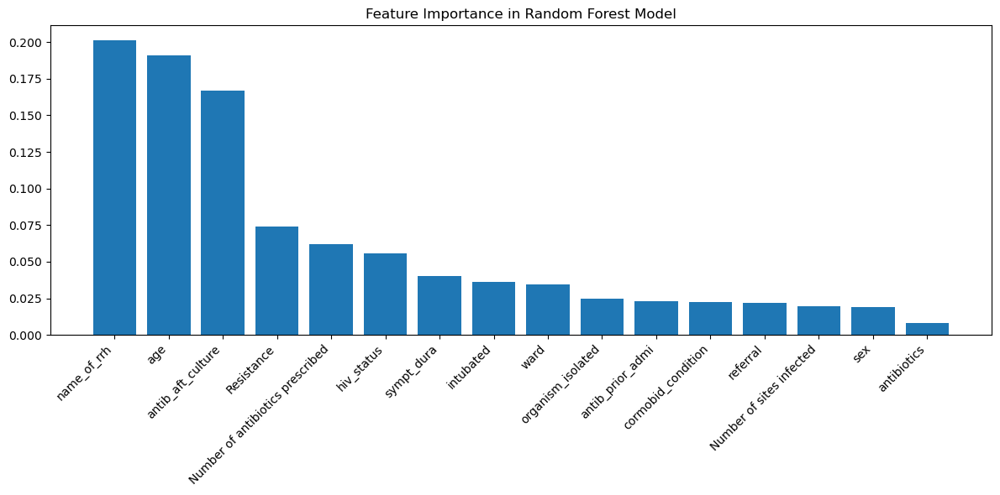

In [63]:
# Get feature importances
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

print("\nFeature Importance with Best Parameters:")
print(feature_importance)

# Visualize feature importance
plt.figure(figsize=(12, 6))
plt.bar(feature_importance['feature'], feature_importance['importance'])
plt.xticks(rotation=45, ha='right')
plt.title('Feature Importance in Random Forest Model')
plt.tight_layout()
plt.show()

In [64]:
import numpy as np
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import pandas as pd

# Prepare the data
# X = data.drop(columns='length_hosp_stay')
X = data[['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex']]
y = np.log1p(data['length_hosp_stay'])
y = np.log1p(data['length_hosp_stay'])

# Define custom scorer for original scale RMSE
def custom_rmse_scorer(y_true, y_pred):
    return np.sqrt(mean_squared_error(np.expm1(y_true), np.expm1(y_pred)))

rmse_scorer = make_scorer(custom_rmse_scorer, greater_is_better=False)

# Define parameter distributions
param_dist = {
    'n_estimators': [500, 750, 1000, 1500],
    'max_features': [0.5, 0.6, 0.7, 0.8, 0.9],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_depth': [None, 2, 8, 12],
    'bootstrap': [True, False]
}

# Create Random Forest model
rf = RandomForestRegressor(random_state=1)

# Perform randomized search
random_search = RandomizedSearchCV(
    rf,
    param_distributions=param_dist,
    n_iter=2000,
    cv=3,
    scoring='r2',
    n_jobs=-1,
    random_state=1,
    verbose=1
)

# Fit the random search
random_search.fit(X, y)

# Print results
print("Best parameters found:")
print(random_search.best_params_)
print("\nBest RMSE:", -random_search.best_score_)

# Get all results
results = pd.DataFrame(random_search.cv_results_)
results = results.sort_values('mean_test_score', ascending=False)

# Print top 5 combinations
print("\nTop 5 parameter combinations:")
for i in range(5):
    params = results.iloc[i]['params']
    score = -results.iloc[i]['mean_test_score']
    std = results.iloc[i]['std_test_score']
    print(f"\nRank {i+1}:")
    print(f"Parameters: {params}")
    print(f"RMSE: {score:.2f} (+/- {std*2:.2f})")

# Train best model and get feature importance
best_model = RandomForestRegressor(**random_search.best_params_, random_state=1)
best_model.fit(X, y)

Fitting 3 folds for each of 2000 candidates, totalling 6000 fits


/home/kyomukama/anaconda3/lib/python3.12/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best parameters found:
{'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_features': 0.7, 'max_depth': 2, 'bootstrap': True}

Best RMSE: -0.11138099568275672

Top 5 parameter combinations:

Rank 1:
Parameters: {'n_estimators': 500, 'min_samples_split': 6, 'min_samples_leaf': 8, 'max_features': 0.7, 'max_depth': 2, 'bootstrap': True}
RMSE: -0.11 (+/- 0.01)

Rank 2:
Parameters: {'n_estimators': 500, 'min_samples_split': 4, 'min_samples_leaf': 8, 'max_features': 0.7, 'max_depth': 2, 'bootstrap': True}
RMSE: -0.11 (+/- 0.01)

Rank 3:
Parameters: {'n_estimators': 500, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 0.7, 'max_depth': 2, 'bootstrap': True}
RMSE: -0.11 (+/- 0.01)

Rank 4:
Parameters: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_features': 0.7, 'max_depth': 2, 'bootstrap': True}
RMSE: -0.11 (+/- 0.01)

Rank 5:
Parameters: {'n_estimators': 500, 'min_samples_split': 10, 'min_samples_leaf': 8, 'max_features': 0.8

RandomForestRegressor(max_depth=2, max_features=0.7, min_samples_leaf=8,
                      min_samples_split=10, n_estimators=500, random_state=1)

In [65]:
import numpy as np
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import make_scorer, mean_squared_error
import pandas as pd

# Prepare the data
# X = data.drop(columns='length_hosp_stay')
X = data[['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex']]
y = np.log1p(data['length_hosp_stay'])
y = np.log1p(data['length_hosp_stay'])

# Define custom scorer for original scale RMSE
def custom_rmse_scorer(y_true, y_pred):
    return np.sqrt(mean_squared_error(np.expm1(y_true), np.expm1(y_pred)))

rmse_scorer = make_scorer(custom_rmse_scorer, greater_is_better=False)

# Define parameter grid
# Note: For grid search, we need to reduce the parameter space to keep computation time reasonable
param_grid = {
    'n_estimators': [500, 750, 1000, 1500],
    'max_features': [0.5, 0.6, 0.7, 0.8, 0.9],
    'min_samples_split': [2, 4, 6, 8, 10],
    'min_samples_leaf': [1, 2, 4, 6, 8],
    'max_depth': [None, 2, 8, 12],
    'bootstrap': [True, False]
}

# Create Random Forest model
rf = RandomForestRegressor(random_state=1)

# Perform grid search
grid_search = GridSearchCV(
    rf,
    param_grid=param_grid,
    cv=3,
    scoring='r2',  # You can also use rmse_scorer here
    n_jobs=-1,
    verbose=1
)

# Fit the grid search
grid_search.fit(X, y)

# Print results
print("Best parameters found:")
print(grid_search.best_params_)
print("\nBest R² score:", grid_search.best_score_)

# Get all results
results = pd.DataFrame(grid_search.cv_results_)
results = results.sort_values('mean_test_score', ascending=False)

# Print top 5 combinations
print("\nTop 5 parameter combinations:")
for i in range(5):
    params = results.iloc[i]['params']
    score = results.iloc[i]['mean_test_score']
    std = results.iloc[i]['std_test_score']
    print(f"\nRank {i+1}:")
    print(f"Parameters: {params}")
    print(f"R² Score: {score:.4f} (+/- {std*2:.4f})")

# To also evaluate with RMSE on the best model
best_params = grid_search.best_params_
best_model = RandomForestRegressor(**best_params, random_state=1)
best_model.fit(X, y)

# Get feature importances
feature_importance = pd.DataFrame({
    'Feature': X.columns,
    'Importance': best_model.feature_importances_
})
feature_importance = feature_importance.sort_values('Importance', ascending=False)

print("\nFeature Importance:")
print(feature_importance.head(10))  # Top 10 most important features

Fitting 3 folds for each of 4000 candidates, totalling 12000 fits
Best parameters found:
{'bootstrap': True, 'max_depth': 2, 'max_features': 0.7, 'min_samples_leaf': 8, 'min_samples_split': 2, 'n_estimators': 500}

Best R² score: 0.11138099568275672

Top 5 parameter combinations:

Rank 1:
Parameters: {'bootstrap': True, 'max_depth': 2, 'max_features': 0.7, 'min_samples_leaf': 8, 'min_samples_split': 6, 'n_estimators': 500}
R² Score: 0.1114 (+/- 0.0126)

Rank 2:
Parameters: {'bootstrap': True, 'max_depth': 2, 'max_features': 0.7, 'min_samples_leaf': 8, 'min_samples_split': 4, 'n_estimators': 500}
R² Score: 0.1114 (+/- 0.0126)

Rank 3:
Parameters: {'bootstrap': True, 'max_depth': 2, 'max_features': 0.7, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 500}
R² Score: 0.1114 (+/- 0.0126)

Rank 4:
Parameters: {'bootstrap': True, 'max_depth': 2, 'max_features': 0.7, 'min_samples_leaf': 8, 'min_samples_split': 10, 'n_estimators': 500}
R² Score: 0.1114 (+/- 0.0126)

Rank 5:
Param

In [66]:
data.columns

Index(['name_of_rrh', 'age', 'sex', 'Number of sites infected', 'referral',
       'ward', 'antib_prior_admi', 'sympt_dura', 'hiv_status', 'intubated',
       'cormobid_condition', 'antibiotics', 'Number of antibiotics prescribed',
       'organism_isolated', 'Resistance', 'antib_aft_culture',
       'length_hosp_stay'],
      dtype='object')

# GradientBoostingRegressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run bright-squirrel-586 at: http://127.0.0.1:8080/#/experiments/320510952361426209/runs/92778f37e74648afa656382a3581394f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/320510952361426209
Mean Absolute Error: 13.68
Root Mean Squared Error: 21.78
R-squared Score: 0.1404


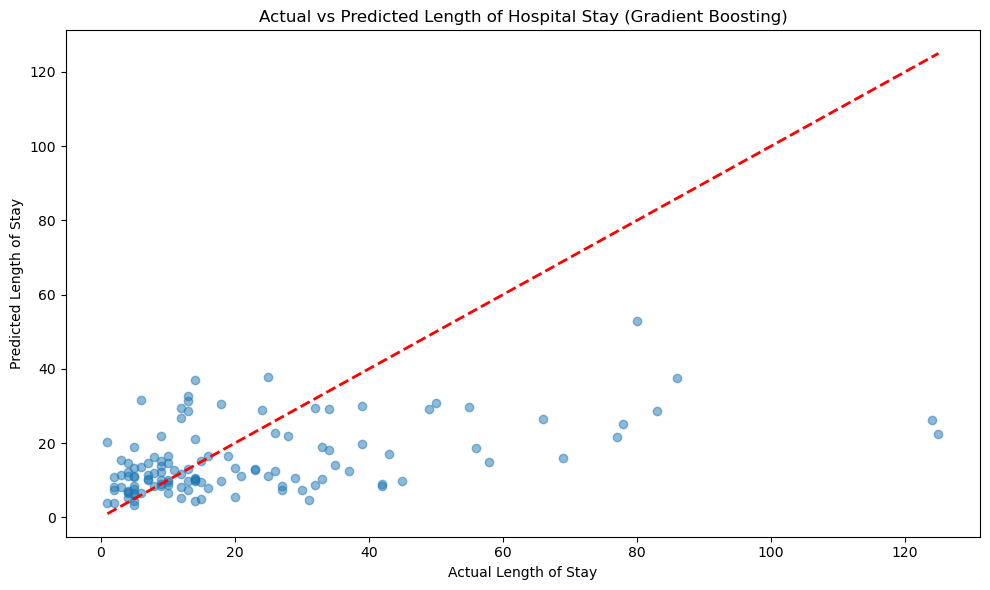

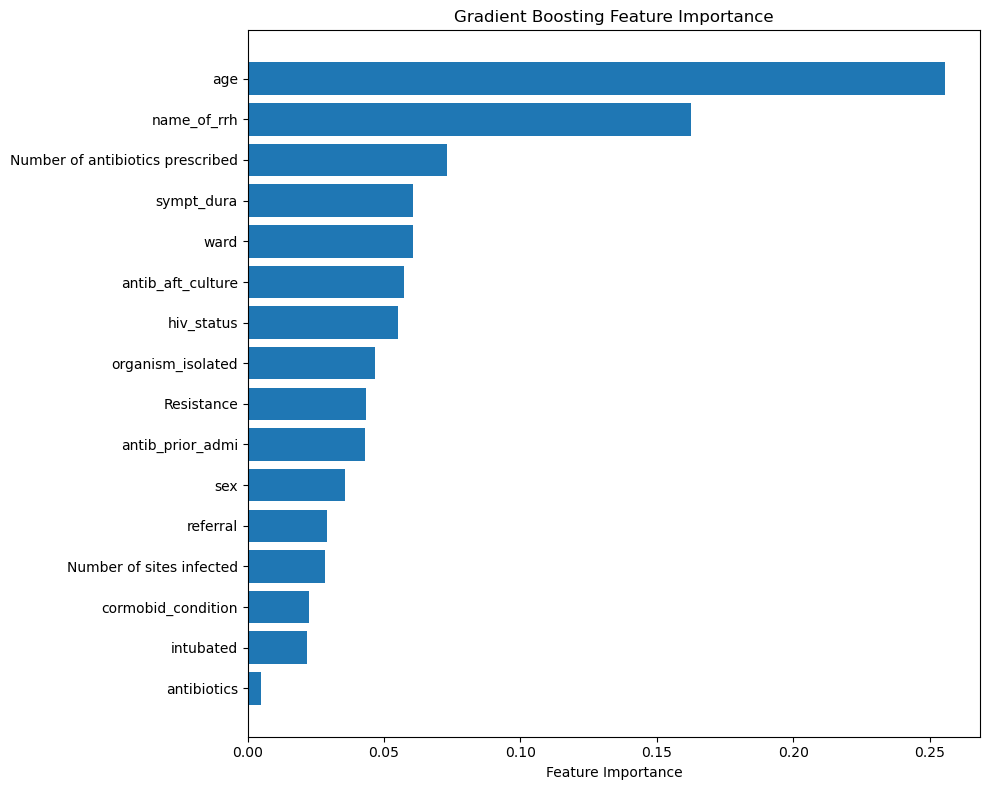

In [67]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
# X = data.drop(columns='length_hosp_stay')
# X = data[[
#     'age', 'name_of_rrh','Antibioitic_aft_cul_1',
#     'first_organism', 'Infection_Site_1', 'ward',
#     'Prescribed_antib_1', 'Prescribed_antib_2',
#     'hiv_status', 'organism_isolated', 'sympt_dura',
#     'Resistance', 'Infection_Site_2', 'complications',
#     'sex', 'antib_prior_admi', 'Prescribed_antib_3',
#     'sec_organism', 'cormobid_condition', 'referral' 
# ]]
# y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

X = data[['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex']]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Gradient Boosting
params = {
    'random_state': 42,
    'n_estimators': 1500,         # Significantly increased for better fit
    'learning_rate': 0.005,       # Further reduced for more precise corrections
    'max_depth': 8,               # Increased to capture more complex patterns
    'min_samples_split': 12,       # Minimum value to create highly specialized trees
    'min_samples_leaf': 4,        # Minimum value for maximum tree detail
    'subsample': 0.8,            # Increased to use more of the training data
    'max_features': 0.6,          # Using most features for splits
    # 'loss': 'huber',      # Direct optimization for MSE
    # 'validation_fraction': 0.2,   # For early stopping
    # 'n_iter_no_change': 100,      # For early stopping
    # 'tol': 1e-5                   # For early stopping
}

# Initialize and train the Gradient Boosting Regressor
gb = GradientBoostingRegressor(**params)
gb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(gb, "GB_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [68]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow GB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "GB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, gb.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="GB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
2025/03/11 12:37:51 WARNING mlflow.models.model: Failed to validate serving input example {
  "dataframe_split": {
    "columns": [
      "Resistance",
      "antib_aft_culture",
      "organism_isolated",
      "age",
      "ward",


🏃 View run likeable-panda-499 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/798a92c0b785493192aa2a26a75feb3b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334


Created version '47' of model 'GB Regressor model'.


Starting hyperparameter tuning with RandomizedSearchCV...
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.1s
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.5917173949330818, min_samples_leaf=8, min_samples_split=14, n_estimators=2638, subsample=0.8337498258560773; total time=   0.2s
[CV] END learning_rate=0.010699098521619942, max_depth=6, max_features=0.9692763545078751, min_samples_leaf=2, min_samples_split=13, n_estimators=3324, subsample=0.8852444528883149; total time=   0.2s
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.5917173949330818, min_samples_leaf=8, min_samples_split=14, n_estimators=2638, subsample=0.8337498258560773; total time=   0.3s
[CV] END learning_rate=0.004745401188473625, max_depth=7, max_features=0.591

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run calm-cub-194 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/53cdbfd15c9d44e4814a581748e2a716
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334

Final Model Performance on Test Set:
Mean Absolute Error: 13.88
Root Mean Squared Error: 22.73
R-squared Score: 0.0640


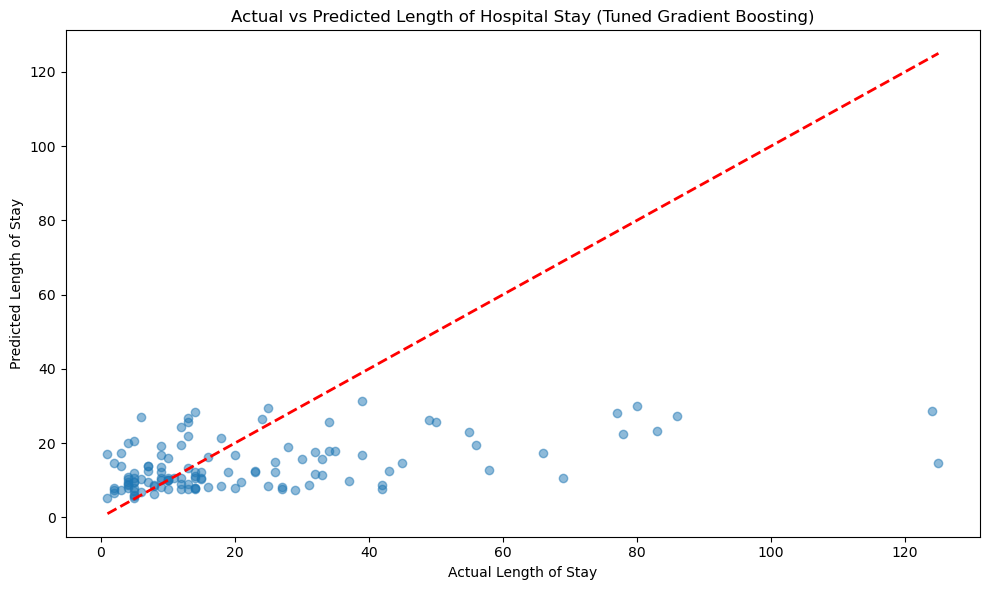

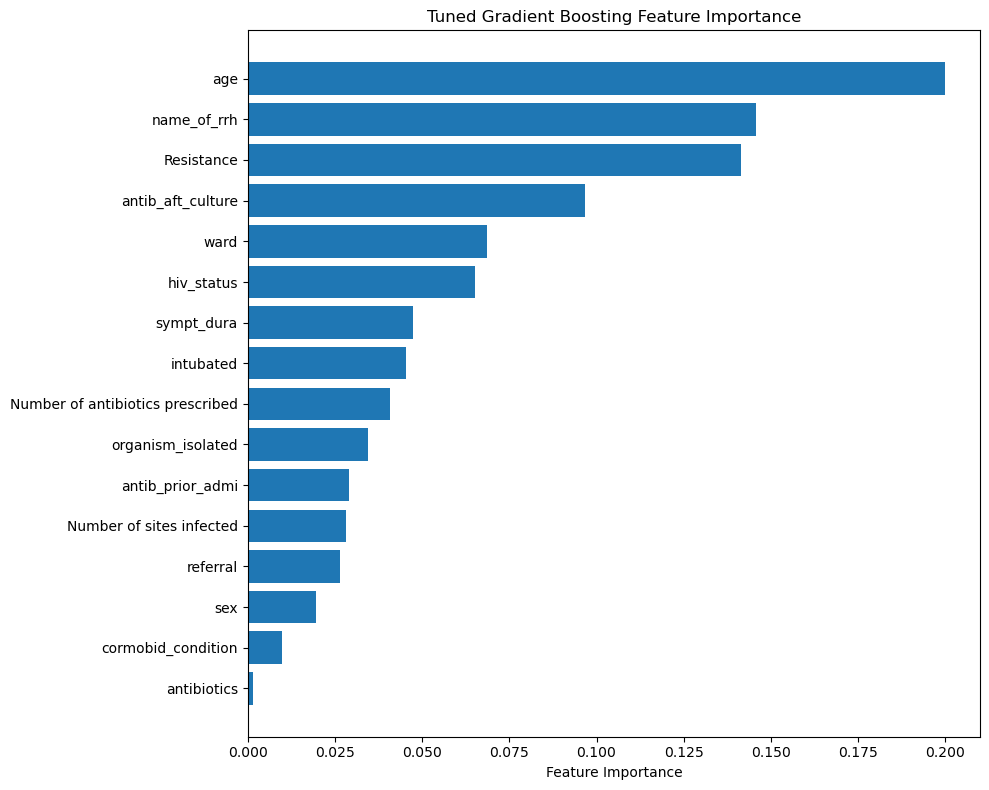

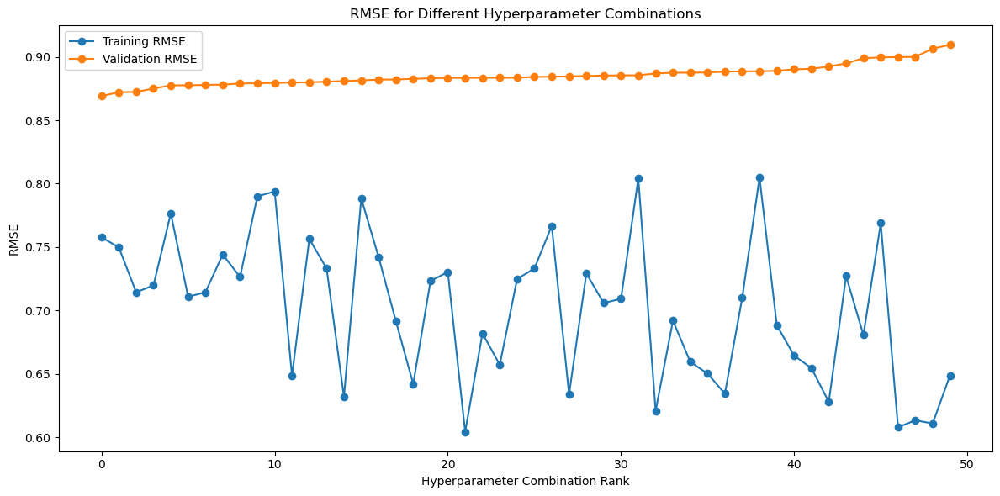

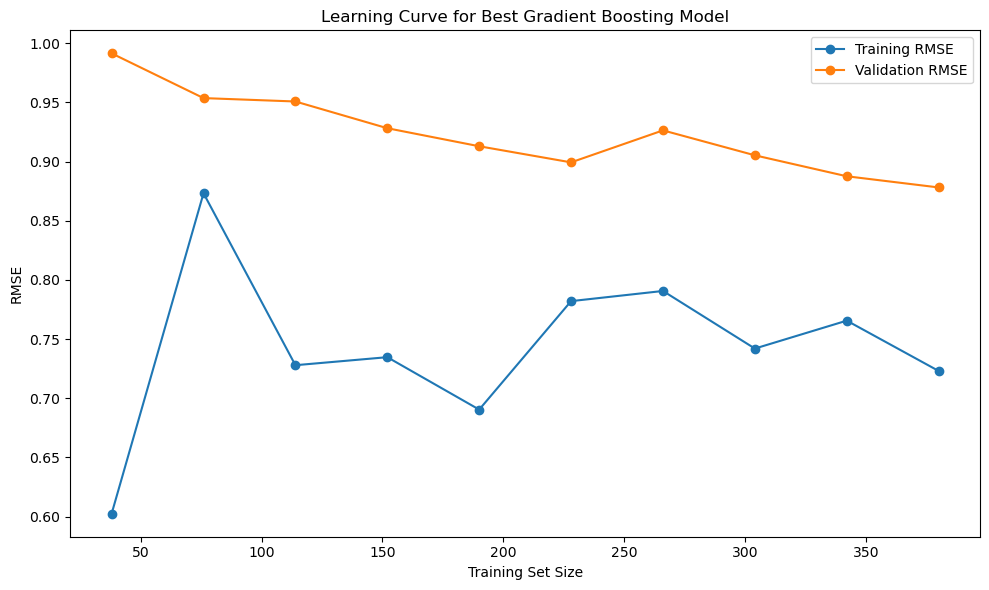

In [69]:
import mlflow
from mlflow.models import infer_signature
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt
from scipy.stats import randint, uniform

# Apply log transformation to the target variable
# X = data.drop(columns='length_hosp_stay')
X = data[['Resistance', 'antib_aft_culture', 'organism_isolated', 'age', 'ward',
       'cormobid_condition', 'name_of_rrh', 'intubated',
       'Number of antibiotics prescribed', 'sympt_dura', 'antibiotics',
       'referral', 'antib_prior_admi', 'Number of sites infected',
       'hiv_status', 'sex']]
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the hyperparameter search space for Gradient Boosting
param_distributions = {
    'n_estimators': randint(1000, 3500),
    'learning_rate': uniform(0.001, 0.01),
    'max_depth': randint(3, 10),
    'min_samples_split': randint(2, 15),
    'min_samples_leaf': randint(1, 10),
    'subsample': uniform(0.7, 0.3),  # This means from 0.7 to 1.0
    'max_features': uniform(0.5, 0.5),  # This means from 0.5 to 1.0
    # 'loss': ['ls'],  # Since we're focused on squared error
}

# Initialize the base model
base_model = GradientBoostingRegressor(
    random_state=10,
    validation_fraction=0.2,
    n_iter_no_change=50,
    tol=1e-5
)

# Set up cross-validation
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=base_model,
    param_distributions=param_distributions,
    n_iter=50,  # Number of parameter settings sampled
    cv=cv,
    scoring='neg_mean_squared_error',
    random_state=42,
    n_jobs=-1,  # Use all available processors
    verbose=2,
    return_train_score=True
)

# Perform the randomized search
print("Starting hyperparameter tuning with RandomizedSearchCV...")
random_search.fit(X_train, y_train)

# Print the best parameters and best score
print("\nBest parameters found:")
print(random_search.best_params_)
print(f"Best RMSE: {np.sqrt(-random_search.best_score_)}")

# Get the best model
best_gb = random_search.best_estimator_

# Make predictions and inverse transform them
y_pred_log = best_gb.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the best model and metrics with MLflow
with mlflow.start_run():
    # Log best parameters
    mlflow.log_params(random_search.best_params_)
    
    # Log metrics
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(best_gb, "best_GB_regressor_model", signature=signature)

# Print the metrics
print("\nFinal Model Performance on Test Set:")
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Create a scatter plot to visualize predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Tuned Gradient Boosting)')
plt.tight_layout()
plt.savefig('gb_predictions_vs_actual.png')
plt.show()

# Feature importance plot for the best model
feature_importance = best_gb.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Tuned Gradient Boosting Feature Importance')
plt.tight_layout()
plt.savefig('gb_feature_importance.png')
plt.show()

# Plot learning curves of the hyperparameter search
results = random_search.cv_results_
plt.figure(figsize=(12, 6))

# Get indices sorted by rank
sorted_indices = np.argsort(results['rank_test_score'])

# Plot the RMSE for each hyperparameter combination
train_scores = -results['mean_train_score'][sorted_indices]
test_scores = -results['mean_test_score'][sorted_indices]
plt.plot(range(len(sorted_indices)), np.sqrt(train_scores), 'o-', label='Training RMSE')
plt.plot(range(len(sorted_indices)), np.sqrt(test_scores), 'o-', label='Validation RMSE')
plt.xlabel('Hyperparameter Combination Rank')
plt.ylabel('RMSE')
plt.title('RMSE for Different Hyperparameter Combinations')
plt.legend()
plt.tight_layout()
plt.savefig('gb_hyperparameter_search_results.png')
plt.show()

# Optional: Plot learning curve of the best model
from sklearn.model_selection import learning_curve

train_sizes, train_scores, valid_scores = learning_curve(
    best_gb, X_train, y_train, 
    train_sizes=np.linspace(0.1, 1.0, 10),
    cv=5, scoring='neg_mean_squared_error',
    n_jobs=-1
)

# Calculate RMSE from MSE
train_rmse = np.sqrt(-np.mean(train_scores, axis=1))
valid_rmse = np.sqrt(-np.mean(valid_scores, axis=1))

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_rmse, 'o-', label='Training RMSE')
plt.plot(train_sizes, valid_rmse, 'o-', label='Validation RMSE')
plt.xlabel('Training Set Size')
plt.ylabel('RMSE')
plt.title('Learning Curve for Best Gradient Boosting Model')
plt.legend()
plt.tight_layout()
plt.savefig('gb_learning_curve.png')
plt.show()

# Light gbm regressor

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001977 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 117
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 16
[LightGBM] [Info] Start training from score 2.645756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run abundant-turtle-153 at: http://127.0.0.1:8080/#/experiments/442355567818203334/runs/11c4cc97423b4acdb94b5da87268d862
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/442355567818203334
Mean Absolute Error: 13.54
Root Mean Squared Error: 22.00
R-squared Score: 0.1232


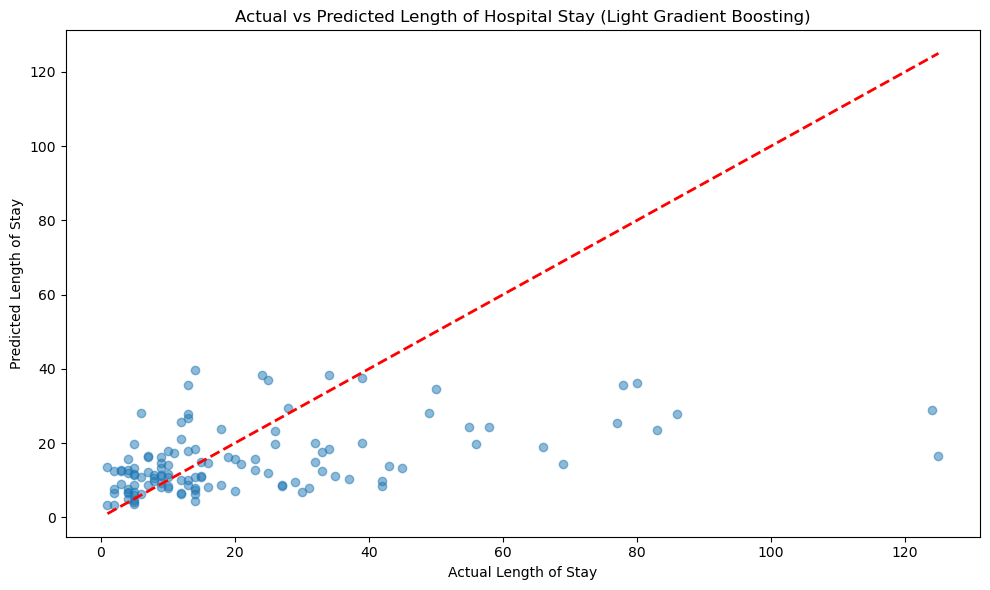

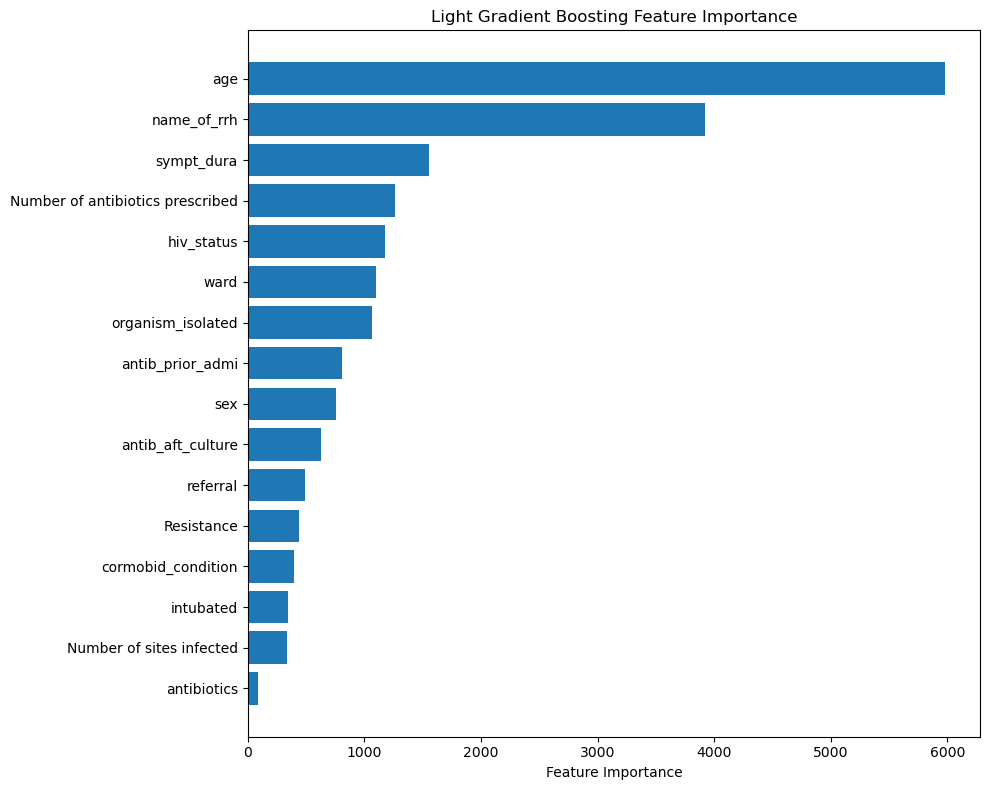

In [70]:
from lightgbm import LGBMRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'objective' : 'regression',
    'random_state': 10,
    'n_estimators': 2500,         # Significantly increased for better fit
    'learning_rate': 0.005,       # Further reduced for more precise corrections
    'max_depth': 4,               # Increased to capture more complex patterns
    'num_leaves': 85, 
    'boosting_type' : 'gbdt',
    'subsample_for_bin'  : 25000               
}

# Initialize and train the Light Gradient Boosting Regressor
lgbm = LGBMRegressor(**params)
lgbm.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lgbm, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [71]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow LGBM Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "LGBM_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="LGBM Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LGBM Regressor model' already exists. Creating a new version of this model...
2025/03/11 12:38:18 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mode

🏃 View run popular-sloth-514 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/13f15b0f89324019bfd2cf0b428ddcd8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341


Created version '23' of model 'LGBM Regressor model'.


In [72]:
import optuna

# Ensure growth is defined
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define objective function for Optuna
def objective(trial):
    params = {
        'objective': 'regression',
        'boosting_type': 'gbdt',
        'random_state': 10,
        'n_estimators': trial.suggest_int('n_estimators', 1000, 3000, step=500),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.02, log=True),
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150, step=10),
        'subsample_for_bin': trial.suggest_int('subsample_for_bin', 20000, 50000, step=5000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50, step=5),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
    }

    # Train model
    lgbm = LGBMRegressor(**params)
    lgbm.fit(X_train, y_train, eval_set=[(X_test, y_test)])
    
    # Predict and evaluate
    y_pred_log = lgbm.predict(X_test)
    y_pred = np.expm1(y_pred_log)
    y_test_original = np.expm1(y_test)
    
    mae = mean_absolute_error(y_test_original, y_pred)
    return mae  # Minimizing MAE

# Run Optuna optimization
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

# Get best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

# Train final model with best parameters
lgbm_final = LGBMRegressor(**best_params)
lgbm_final.fit(X_train, y_train)

# Evaluate on test set
y_pred_log = lgbm_final.predict(X_test)
y_pred = np.expm1(y_pred_log)
y_test_original = np.expm1(y_test)

mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log best model with MLflow
with mlflow.start_run():
    mlflow.log_params(best_params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    mlflow.sklearn.log_model(lgbm_final, "LGBM_regressor_optimized")

# Print final metrics
print(f"Optimized Mean Absolute Error: {mae:.2f}")
print(f"Optimized Root Mean Squared Error: {rmse:.2f}")
print(f"Optimized R-squared Score: {r2:.4f}")

[I 2025-03-11 12:38:18,891] A new study created in memory with name: no-name-b1ba84aa-8dcc-48a0-9bac-fed8fbbbd07b


[LightGBM] [Warning] lambda_l2 is set=0.004065285557625617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004065285557625617
[LightGBM] [Warning] lambda_l1 is set=0.00010440398935106647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010440398935106647
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.004065285557625617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004065285557625617
[LightGBM] [Warning] lambda_l1 is set=0.00010440398935106647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00010440398935106647
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 14
[LightGBM] [

[I 2025-03-11 12:38:20,877] Trial 0 finished with value: 13.41259247523588 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0018523727955628102, 'max_depth': 7, 'num_leaves': 30, 'subsample_for_bin': 25000, 'min_child_samples': 50, 'lambda_l1': 0.00010440398935106647, 'lambda_l2': 0.004065285557625617}. Best is trial 0 with value: 13.41259247523588.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:21,630] Trial 1 finished with value: 13.12832579038934 and parameters: {'n_estimators': 2000, 'learning_rate': 0.009777746079064033, 'max_depth': 2, 'num_leaves': 50, 'subsample_for_bin': 25000, 'min_child_samples': 50, 'lambda_l1': 2.066450948505373e-05, 'lambda_l2': 2.0802148584762504e-08}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:23,524] Trial 2 finished with value: 13.706426099260124 and parameters: {'n_estimators': 2500, 'learning_rate': 0.010416768723465395, 'max_depth': 8, 'num_leaves': 40, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 1.683390865031408, 'lambda_l2': 0.005947860378087406}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=1.209806718157585e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.209806718157585e-06
[LightGBM] [Warning] lambda_l1 is set=3.4964610992140756e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4964610992140756e-06
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1.209806718157585e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.209806718157585e-06
[LightGBM] [Warning] lambda_l1 is set=3.4964610992140756e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4964610992140756e-06
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000461 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 14
[LightGB

[I 2025-03-11 12:38:24,420] Trial 3 finished with value: 13.633497939644931 and parameters: {'n_estimators': 1500, 'learning_rate': 0.016810793466450813, 'max_depth': 3, 'num_leaves': 120, 'subsample_for_bin': 35000, 'min_child_samples': 45, 'lambda_l1': 3.4964610992140756e-06, 'lambda_l2': 1.209806718157585e-06}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:26,459] Trial 4 finished with value: 13.252864614505992 and parameters: {'n_estimators': 2500, 'learning_rate': 0.003502102904272183, 'max_depth': 7, 'num_leaves': 30, 'subsample_for_bin': 50000, 'min_child_samples': 45, 'lambda_l1': 3.932720781049446, 'lambda_l2': 0.008930471646250536}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:29,727] Trial 5 finished with value: 14.070062387192236 and parameters: {'n_estimators': 3000, 'learning_rate': 0.010047753528325638, 'max_depth': 10, 'num_leaves': 40, 'subsample_for_bin': 25000, 'min_child_samples': 30, 'lambda_l1': 8.221142427509401e-07, 'lambda_l2': 0.0003576543352781538}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:31,087] Trial 6 finished with value: 13.375813313819327 and parameters: {'n_estimators': 2000, 'learning_rate': 0.004815172509231505, 'max_depth': 5, 'num_leaves': 20, 'subsample_for_bin': 40000, 'min_child_samples': 50, 'lambda_l1': 7.771930460305366e-06, 'lambda_l2': 0.34118381574813417}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:32,382] Trial 7 finished with value: 13.386966273535412 and parameters: {'n_estimators': 2500, 'learning_rate': 0.012964074622066307, 'max_depth': 7, 'num_leaves': 140, 'subsample_for_bin': 20000, 'min_child_samples': 30, 'lambda_l1': 2.8407560107616936, 'lambda_l2': 5.148260406658009e-07}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training beca

[I 2025-03-11 12:38:34,001] Trial 8 finished with value: 13.822768939044428 and parameters: {'n_estimators': 2500, 'learning_rate': 0.018260308753076073, 'max_depth': 4, 'num_leaves': 130, 'subsample_for_bin': 20000, 'min_child_samples': 50, 'lambda_l1': 2.441659005351999e-07, 'lambda_l2': 2.651765792040248}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=4.842044748766617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.842044748766617
[LightGBM] [Warning] lambda_l1 is set=0.05306569735591153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05306569735591153
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=4.842044748766617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.842044748766617
[LightGBM] [Warning] lambda_l1 is set=0.05306569735591153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05306569735591153
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 117
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 16
[LightGBM] [Warning] lambda_l2 is se

[I 2025-03-11 12:38:42,337] Trial 9 finished with value: 13.89515110590469 and parameters: {'n_estimators': 3000, 'learning_rate': 0.008484988862257231, 'max_depth': 8, 'num_leaves': 30, 'subsample_for_bin': 35000, 'min_child_samples': 5, 'lambda_l1': 0.05306569735591153, 'lambda_l2': 4.842044748766617}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=4.842044748766617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.842044748766617
[LightGBM] [Warning] lambda_l1 is set=0.05306569735591153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05306569735591153
[LightGBM] [Warning] lambda_l2 is set=1.007559746311194e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.007559746311194e-08
[LightGBM] [Warning] lambda_l1 is set=0.0054234263900514775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0054234263900514775
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1.007559746311194e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.007559746311194e-08
[LightGBM] [Warning] lambda_l1 is set=0.0054234263900514775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0054234263900514775
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001134 

[I 2025-03-11 12:38:42,727] Trial 10 finished with value: 14.15077982573263 and parameters: {'n_estimators': 1000, 'learning_rate': 0.001039449816498213, 'max_depth': 2, 'num_leaves': 80, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.0054234263900514775, 'lambda_l2': 1.007559746311194e-08}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=1.007559746311194e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.007559746311194e-08
[LightGBM] [Warning] lambda_l1 is set=0.0054234263900514775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0054234263900514775
[LightGBM] [Warning] lambda_l2 is set=1.8737344770731086e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8737344770731086e-05
[LightGBM] [Warning] lambda_l1 is set=0.0006779801877931411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006779801877931411
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1.8737344770731086e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8737344770731086e-05
[LightGBM] [Warning] lambda_l1 is set=0.0006779801877931411, reg_alp

[I 2025-03-11 12:38:44,424] Trial 11 finished with value: 13.943329901268434 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003934351963589921, 'max_depth': 5, 'num_leaves': 70, 'subsample_for_bin': 50000, 'min_child_samples': 35, 'lambda_l1': 0.0006779801877931411, 'lambda_l2': 1.8737344770731086e-05}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:45,757] Trial 12 finished with value: 13.603110577159876 and parameters: {'n_estimators': 1500, 'learning_rate': 0.004411350944303757, 'max_depth': 10, 'num_leaves': 60, 'subsample_for_bin': 50000, 'min_child_samples': 40, 'lambda_l1': 1.1617452270591522e-08, 'lambda_l2': 0.035534911406906615}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.035534911406906615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035534911406906615
[LightGBM] [Warning] lambda_l1 is set=1.1617452270591522e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1617452270591522e-08
[LightGBM] [Warning] lambda_l2 is set=0.00010690576725309752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010690576725309752
[LightGBM] [Warning] lambda_l1 is set=0.04892193798063816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04892193798063816
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.00010690576725309752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010690576725309752
[LightGBM] [Warning] lambda_l1 is set=0.04892193798063816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04892193798063816
[LightGBM] [

[I 2025-03-11 12:38:46,303] Trial 13 finished with value: 13.434869532424232 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0026893862106524527, 'max_depth': 2, 'num_leaves': 60, 'subsample_for_bin': 45000, 'min_child_samples': 40, 'lambda_l1': 0.04892193798063816, 'lambda_l2': 0.00010690576725309752}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:48,756] Trial 14 finished with value: 13.706058488284922 and parameters: {'n_estimators': 2000, 'learning_rate': 0.006422961809717484, 'max_depth': 6, 'num_leaves': 100, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 0.00010629961021757449, 'lambda_l2': 1.4306548566597822e-08}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=2.014909007216951e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014909007216951e-06
[LightGBM] [Warning] lambda_l1 is set=0.19688070319731965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19688070319731965
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=2.014909007216951e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014909007216951e-06
[LightGBM] [Warning] lambda_l1 is set=0.19688070319731965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19688070319731965
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000283 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 14
[LightGBM] [Warning]

[I 2025-03-11 12:38:50,507] Trial 15 finished with value: 13.638044874879617 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0028082157844692593, 'max_depth': 4, 'num_leaves': 50, 'subsample_for_bin': 45000, 'min_child_samples': 40, 'lambda_l1': 0.19688070319731965, 'lambda_l2': 2.014909007216951e-06}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:54,174] Trial 16 finished with value: 13.30208017141154 and parameters: {'n_estimators': 2500, 'learning_rate': 0.006580948175381092, 'max_depth': 8, 'num_leaves': 100, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 0.0015843859935691018, 'lambda_l2': 0.0008758873878671968}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:56,054] Trial 17 finished with value: 13.690808532379 and parameters: {'n_estimators': 2000, 'learning_rate': 0.001723832187788275, 'max_depth': 6, 'num_leaves': 20, 'subsample_for_bin': 25000, 'min_child_samples': 35, 'lambda_l1': 1.5211710725994466e-05, 'lambda_l2': 0.07438092760587747}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=0.07438092760587747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07438092760587747
[LightGBM] [Warning] lambda_l1 is set=1.5211710725994466e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5211710725994466e-05
[LightGBM] [Warning] lambda_l2 is set=1.423617281584852e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.423617281584852e-07
[LightGBM] [Warning] lambda_l1 is set=5.662593239677473e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662593239677473e-08
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1.423617281584852e-07, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.423617281584852e-07
[LightGBM] [Warning] lambda_l1 is set=5.662593239677473e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.662593239677473e-08
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was

[I 2025-03-11 12:38:57,575] Trial 18 finished with value: 13.551682132642894 and parameters: {'n_estimators': 2000, 'learning_rate': 0.002969025443133252, 'max_depth': 9, 'num_leaves': 90, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 5.662593239677473e-08, 'lambda_l2': 1.423617281584852e-07}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:38:58,393] Trial 19 finished with value: 13.572818382562456 and parameters: {'n_estimators': 1500, 'learning_rate': 0.006312442378956533, 'max_depth': 3, 'num_leaves': 50, 'subsample_for_bin': 45000, 'min_child_samples': 25, 'lambda_l1': 0.016886212413795475, 'lambda_l2': 6.22575696043288e-05}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:00,093] Trial 20 finished with value: 13.863350141724588 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0019528555298623357, 'max_depth': 5, 'num_leaves': 70, 'subsample_for_bin': 20000, 'min_child_samples': 5, 'lambda_l1': 0.645018668414015, 'lambda_l2': 8.467286829938729e-06}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=8.467286829938729e-06, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.467286829938729e-06
[LightGBM] [Warning] lambda_l1 is set=0.645018668414015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.645018668414015
[LightGBM] [Warning] lambda_l2 is set=0.0014072920478483484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014072920478483484
[LightGBM] [Warning] lambda_l1 is set=0.0013188096912903936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013188096912903936
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.0014072920478483484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0014072920478483484
[LightGBM] [Warning] lambda_l1 is set=0.0013188096912903936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013188096912903936
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000

[I 2025-03-11 12:39:04,456] Trial 21 finished with value: 13.9231526105925 and parameters: {'n_estimators': 2500, 'learning_rate': 0.006946049659673193, 'max_depth': 8, 'num_leaves': 110, 'subsample_for_bin': 30000, 'min_child_samples': 15, 'lambda_l1': 0.0013188096912903936, 'lambda_l2': 0.0014072920478483484}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:05,991] Trial 22 finished with value: 13.51329084038767 and parameters: {'n_estimators': 2500, 'learning_rate': 0.005339575373869437, 'max_depth': 7, 'num_leaves': 90, 'subsample_for_bin': 30000, 'min_child_samples': 20, 'lambda_l1': 8.125201868286586, 'lambda_l2': 0.000815814573292643}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:13,208] Trial 23 finished with value: 13.802591170724092 and parameters: {'n_estimators': 3000, 'learning_rate': 0.003502604213230072, 'max_depth': 9, 'num_leaves': 150, 'subsample_for_bin': 25000, 'min_child_samples': 10, 'lambda_l1': 0.0031640922459927117, 'lambda_l2': 0.01736448641319563}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:15,737] Trial 24 finished with value: 13.967017320023377 and parameters: {'n_estimators': 2000, 'learning_rate': 0.014302719800304176, 'max_depth': 9, 'num_leaves': 110, 'subsample_for_bin': 35000, 'min_child_samples': 25, 'lambda_l1': 0.00013512222506880444, 'lambda_l2': 0.3022880043271783}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:18,121] Trial 25 finished with value: 13.845547493083329 and parameters: {'n_estimators': 2500, 'learning_rate': 0.00939886650913873, 'max_depth': 7, 'num_leaves': 40, 'subsample_for_bin': 30000, 'min_child_samples': 35, 'lambda_l1': 2.681520746703614e-05, 'lambda_l2': 0.00010621673328847986}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:21,136] Trial 26 finished with value: 13.504368108643794 and parameters: {'n_estimators': 2500, 'learning_rate': 0.007882518344503396, 'max_depth': 6, 'num_leaves': 80, 'subsample_for_bin': 35000, 'min_child_samples': 20, 'lambda_l1': 3.340279815656438e-06, 'lambda_l2': 0.002595299799384394}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=0.002595299799384394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002595299799384394
[LightGBM] [Warning] lambda_l1 is set=3.340279815656438e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.340279815656438e-06
[LightGBM] [Warning] lambda_l2 is set=1.3398755988058154e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3398755988058154e-05
[LightGBM] [Warning] lambda_l1 is set=6.322670596860562e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322670596860562e-07
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=1.3398755988058154e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3398755988058154e-05
[LightGBM] [Warning] lambda_l1 is set=6.322670596860562e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.322670596860562e-07
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing

[I 2025-03-11 12:39:22,664] Trial 27 finished with value: 13.828214687157695 and parameters: {'n_estimators': 2000, 'learning_rate': 0.01185731022969852, 'max_depth': 8, 'num_leaves': 100, 'subsample_for_bin': 25000, 'min_child_samples': 45, 'lambda_l1': 6.322670596860562e-07, 'lambda_l2': 1.3398755988058154e-05}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:24,569] Trial 28 finished with value: 13.56613609262701 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0056225973114902034, 'max_depth': 4, 'num_leaves': 60, 'subsample_for_bin': 50000, 'min_child_samples': 50, 'lambda_l1': 0.389310099089267, 'lambda_l2': 9.10308330623589e-08}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=9.10308330623589e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.10308330623589e-08
[LightGBM] [Warning] lambda_l1 is set=0.389310099089267, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.389310099089267
[LightGBM] [Warning] lambda_l2 is set=0.008441748823506836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008441748823506836
[LightGBM] [Warning] lambda_l1 is set=0.00033094701873897625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033094701873897625
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.008441748823506836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008441748823506836
[LightGBM] [Warning] lambda_l1 is set=0.00033094701873897625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033094701873897625
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00032

[I 2025-03-11 12:39:26,657] Trial 29 finished with value: 13.409492585933565 and parameters: {'n_estimators': 3000, 'learning_rate': 0.0017913713315423471, 'max_depth': 6, 'num_leaves': 30, 'subsample_for_bin': 20000, 'min_child_samples': 50, 'lambda_l1': 0.00033094701873897625, 'lambda_l2': 0.008441748823506836}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:31,119] Trial 30 finished with value: 13.94157727923504 and parameters: {'n_estimators': 2500, 'learning_rate': 0.007498974810051831, 'max_depth': 7, 'num_leaves': 20, 'subsample_for_bin': 25000, 'min_child_samples': 15, 'lambda_l1': 4.5203880825330745e-05, 'lambda_l2': 0.08182756500125411}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] lambda_l2 is set=0.08182756500125411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08182756500125411
[LightGBM] [Warning] lambda_l1 is set=4.5203880825330745e-05, reg_alpha=0.0 will be ignored. Current value: lambda

[I 2025-03-11 12:39:32,492] Trial 31 finished with value: 13.41160005234625 and parameters: {'n_estimators': 2000, 'learning_rate': 0.00521031791000295, 'max_depth': 5, 'num_leaves': 20, 'subsample_for_bin': 40000, 'min_child_samples': 50, 'lambda_l1': 2.3117949698628503e-06, 'lambda_l2': 1.285761315803732}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=1.285761315803732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.285761315803732
[LightGBM] [Warning] lambda_l1 is set=2.3117949698628503e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3117949698628503e-06
[LightGBM] [Warning] lambda_l2 is set=0.7487739250669014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7487739250669014
[LightGBM] [Warning] lambda_l1 is set=1.3162111052552727e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162111052552727e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.7487739250669014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7487739250669014
[LightGBM] [Warning] lambda_l1 is set=1.3162111052552727e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3162111052552727e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000396 se

[I 2025-03-11 12:39:33,563] Trial 32 finished with value: 13.241093548534396 and parameters: {'n_estimators': 2000, 'learning_rate': 0.004481861711748097, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 40000, 'min_child_samples': 50, 'lambda_l1': 1.3162111052552727e-05, 'lambda_l2': 0.7487739250669014}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:34,505] Trial 33 finished with value: 13.265386036568229 and parameters: {'n_estimators': 1500, 'learning_rate': 0.003935606344009668, 'max_depth': 3, 'num_leaves': 40, 'subsample_for_bin': 45000, 'min_child_samples': 45, 'lambda_l1': 7.140174856772516e-05, 'lambda_l2': 0.5779769051420522}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=0.5779769051420522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5779769051420522
[LightGBM] [Warning] lambda_l1 is set=7.140174856772516e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.140174856772516e-05
[LightGBM] [Warning] lambda_l2 is set=0.5544673816867802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5544673816867802
[LightGBM] [Warning] lambda_l1 is set=5.2972654462690266e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2972654462690266e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.5544673816867802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5544673816867802
[LightGBM] [Warning] lambda_l1 is set=5.2972654462690266e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.2972654462690266e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000845 se

[I 2025-03-11 12:39:35,480] Trial 34 finished with value: 13.355508001015057 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0022754060401837467, 'max_depth': 3, 'num_leaves': 40, 'subsample_for_bin': 45000, 'min_child_samples': 45, 'lambda_l1': 5.2972654462690266e-05, 'lambda_l2': 0.5544673816867802}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:36,205] Trial 35 finished with value: 13.385419338142633 and parameters: {'n_estimators': 1500, 'learning_rate': 0.003530803645557546, 'max_depth': 2, 'num_leaves': 50, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 9.787628190187863e-06, 'lambda_l2': 8.516027499271537}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:36,844] Trial 36 finished with value: 13.983818053565942 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0012637758268920576, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 50000, 'min_child_samples': 40, 'lambda_l1': 0.00024999608302190976, 'lambda_l2': 0.2853451162074061}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:37,455] Trial 37 finished with value: 13.354008389015098 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0041252078013664754, 'max_depth': 2, 'num_leaves': 40, 'subsample_for_bin': 45000, 'min_child_samples': 50, 'lambda_l1': 2.4766764567815896e-07, 'lambda_l2': 1.4877991945208369}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:38,588] Trial 38 finished with value: 13.270735762428398 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003194190722122959, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 9.06726728208863e-07, 'lambda_l2': 0.09951107506582134}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:39,593] Trial 39 finished with value: 13.473731161419932 and parameters: {'n_estimators': 1500, 'learning_rate': 0.002267971534961813, 'max_depth': 4, 'num_leaves': 50, 'subsample_for_bin': 45000, 'min_child_samples': 50, 'lambda_l1': 7.095204621916095e-06, 'lambda_l2': 0.015873956894818683}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:40,339] Trial 40 finished with value: 13.290548780311068 and parameters: {'n_estimators': 2000, 'learning_rate': 0.004721217356902956, 'max_depth': 2, 'num_leaves': 40, 'subsample_for_bin': 50000, 'min_child_samples': 45, 'lambda_l1': 0.007976481837994934, 'lambda_l2': 0.00600786738627358}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=0.0853501618490938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0853501618490938
[LightGBM] [Warning] lambda_l1 is set=8.806732697681221e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806732697681221e-07
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.0853501618490938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0853501618490938
[LightGBM] [Warning] lambda_l1 is set=8.806732697681221e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806732697681221e-07
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000751 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 14
[LightGBM] [Warning] lambda_l2 is set=0.0853501618490938, reg_lambda=0.0 will be ignored

[I 2025-03-11 12:39:41,579] Trial 41 finished with value: 13.273255480580955 and parameters: {'n_estimators': 2000, 'learning_rate': 0.00337760058090362, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 8.806732697681221e-07, 'lambda_l2': 0.0853501618490938}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=0.1813638474426261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1813638474426261
[LightGBM] [Warning] lambda_l1 is set=1.3834153736322005e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834153736322005e-06
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=0.1813638474426261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1813638474426261
[LightGBM] [Warning] lambda_l1 is set=1.3834153736322005e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3834153736322005e-06
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 113
[LightGBM] [Info] Number of data points in the train set: 476, number of used features: 14
[LightGBM] [Warning]

[I 2025-03-11 12:39:42,662] Trial 42 finished with value: 13.525219698482358 and parameters: {'n_estimators': 2000, 'learning_rate': 0.002510147182788226, 'max_depth': 3, 'num_leaves': 30, 'subsample_for_bin': 40000, 'min_child_samples': 40, 'lambda_l1': 1.3834153736322005e-06, 'lambda_l2': 0.1813638474426261}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:43,958] Trial 43 finished with value: 13.429885917984219 and parameters: {'n_estimators': 2000, 'learning_rate': 0.003134180142637106, 'max_depth': 4, 'num_leaves': 20, 'subsample_for_bin': 45000, 'min_child_samples': 50, 'lambda_l1': 3.31689510045912e-07, 'lambda_l2': 0.6489012646963495}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:44,639] Trial 44 finished with value: 13.320063491004786 and parameters: {'n_estimators': 1000, 'learning_rate': 0.0038746723264213028, 'max_depth': 3, 'num_leaves': 50, 'subsample_for_bin': 40000, 'min_child_samples': 45, 'lambda_l1': 2.3805517180523373e-05, 'lambda_l2': 0.03241444243997442}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:45,234] Trial 45 finished with value: 13.779342464996155 and parameters: {'n_estimators': 1500, 'learning_rate': 0.001477033406992731, 'max_depth': 2, 'num_leaves': 30, 'subsample_for_bin': 35000, 'min_child_samples': 35, 'lambda_l1': 6.15911849201019e-06, 'lambda_l2': 1.0683174469833947}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] lambda_l2 is set=1.0683174469833947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.0683174469833947
[LightGBM] [Warning] lambda_l1 is set=6.15911849201019e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.15911849201019e-06
[LightGBM] [Warning] lambda_l2 is set=3.310336921500218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310336921500218
[LightGBM] [Warning] lambda_l1 is set=8.753410686077507e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753410686077507e-08
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=3.310336921500218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.310336921500218
[LightGBM] [Warning] lambda_l1 is set=8.753410686077507e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753410686077507e-08
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000340 seconds.
You

[I 2025-03-11 12:39:46,274] Trial 46 finished with value: 13.484230878558192 and parameters: {'n_estimators': 2000, 'learning_rate': 0.015549335583560201, 'max_depth': 3, 'num_leaves': 40, 'subsample_for_bin': 50000, 'min_child_samples': 40, 'lambda_l1': 8.753410686077507e-08, 'lambda_l2': 3.310336921500218}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:47,615] Trial 47 finished with value: 13.523122340732487 and parameters: {'n_estimators': 2000, 'learning_rate': 0.010797890426248409, 'max_depth': 4, 'num_leaves': 60, 'subsample_for_bin': 35000, 'min_child_samples': 50, 'lambda_l1': 0.00035787057668336104, 'lambda_l2': 0.18763482427465422}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:48,726] Trial 48 finished with value: 13.554268929899967 and parameters: {'n_estimators': 1500, 'learning_rate': 0.0043829045599752545, 'max_depth': 5, 'num_leaves': 70, 'subsample_for_bin': 45000, 'min_child_samples': 45, 'lambda_l1': 9.71819716774472e-05, 'lambda_l2': 0.00027808972568051896}. Best is trial 1 with value: 13.12832579038934.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2025-03-11 12:39:49,660] Trial 49 finished with value: 13.355665713950298 and parameters: {'n_estimators': 2500, 'learning_rate': 0.0024433290965407716, 'max_depth': 2, 'num_leaves': 20, 'subsample_for_bin': 50000, 'min_child_samples': 30, 'lambda_l1': 8.668216170387796e-08, 'lambda_l2': 0.042981435525182014}. Best is trial 1 with value: 13.12832579038934.


Best hyperparameters: {'n_estimators': 2000, 'learning_rate': 0.009777746079064033, 'max_depth': 2, 'num_leaves': 50, 'subsample_for_bin': 25000, 'min_child_samples': 50, 'lambda_l1': 2.066450948505373e-05, 'lambda_l2': 2.0802148584762504e-08}
[LightGBM] [Warning] lambda_l2 is set=2.0802148584762504e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0802148584762504e-08
[LightGBM] [Warning] lambda_l1 is set=2.066450948505373e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.066450948505373e-05
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] lambda_l2 is set=2.0802148584762504e-08, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0802148584762504e-08
[LightGBM] [Warning] lambda_l1 is set=2.066450948505373e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.066450948505373e-05
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000370 seconds.
You can se

2025/03/11 12:39:52 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run clumsy-wasp-93 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/9c041e015ae64967b60845cbda71b812
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341
Optimized Mean Absolute Error: 13.13
Optimized Root Mean Squared Error: 21.57
Optimized R-squared Score: 0.1564


In [73]:
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBRegressor


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model Selection and Training
# Random Forest Regressor
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)

# XGBoost Regressor
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Model Evaluation
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return mae, mse, r2

rf_mae, rf_mse, rf_r2 = evaluate_model(rf_model, X_test, y_test)
xgb_mae, xgb_mse, xgb_r2 = evaluate_model(xgb_model, X_test, y_test)

print(f"Random Forest - MAE: {rf_mae}, MSE: {rf_mse}, R2: {rf_r2}")
print(f"XGBoost - MAE: {xgb_mae}, MSE: {xgb_mse}, R2: {xgb_r2}")

# Hyperparameter Tuning (Example for XGBoost)
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

grid_search = GridSearchCV(XGBRegressor(random_state=42), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_xgb_model = grid_search.best_estimator_
best_xgb_mae, best_xgb_mse, best_xgb_r2 = evaluate_model(best_xgb_model, X_test, y_test)

print(f"Best XGBoost - MAE: {best_xgb_mae}, MSE: {best_xgb_mse}, R2: {best_xgb_r2}")

Random Forest - MAE: 0.6450413553015546, MSE: 0.617356086126562, R2: 0.2630705541649877
XGBoost - MAE: 0.6866415572055782, MSE: 0.6871325742565789, R2: 0.17977932259620188
Best XGBoost - MAE: 0.6536974275693704, MSE: 0.6381845031457125, R2: 0.23820796002123046


# Extreme gradient boost

/home/kyomukama/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [12:40:23] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "copy_X", "fit_intercept", "max_dept", "max_iter", "positive" } are not used.

  warnings.warn(smsg, UserWarning)
/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_

🏃 View run zealous-flea-94 at: http://127.0.0.1:8080/#/experiments/822887533196691341/runs/1ccbb71e0fd546b2a553586276c45cf8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/822887533196691341
Mean Absolute Error: 13.54
Root Mean Squared Error: 22.00
R-squared Score: 0.1232


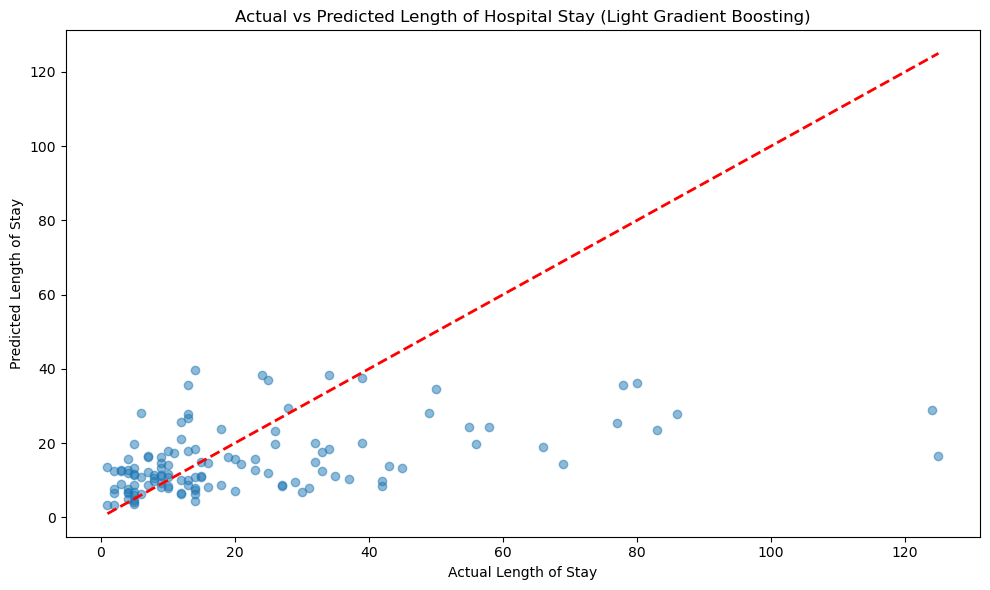

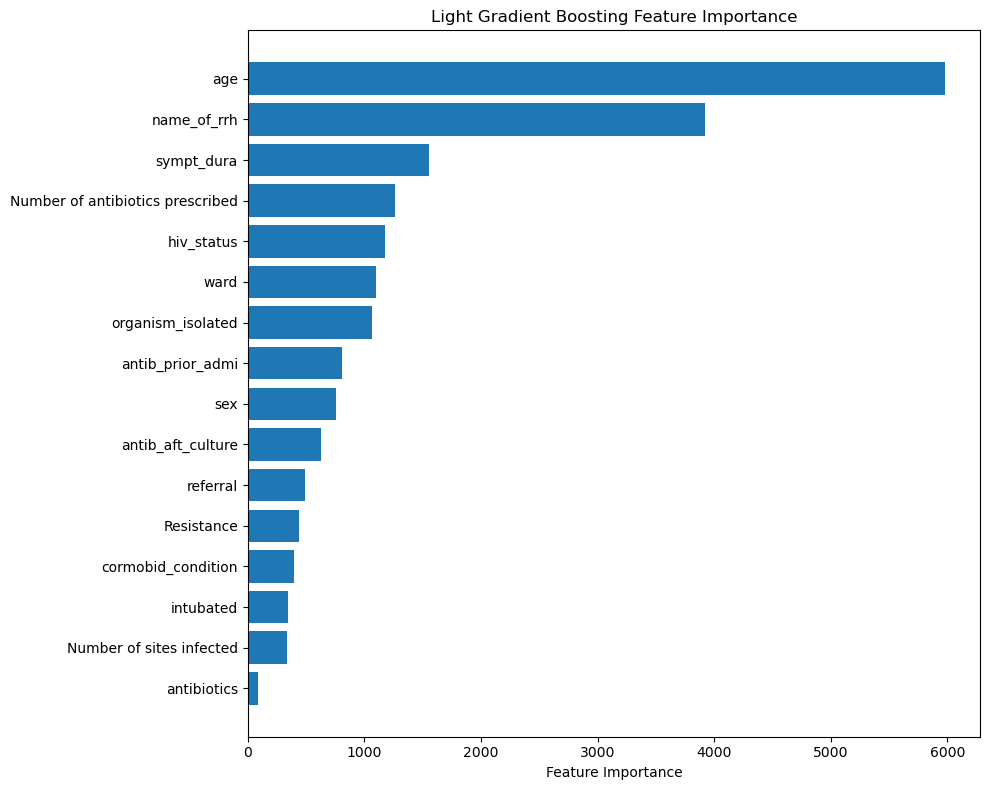

In [74]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'positive' : True,
    'random_state': 10,
    'max_iter': 1500,        
    'alpha': 0.006,   
    'fit_intercept': True,               
    'copy_X': True,
    'max_dept': 7,
    'subsample': 0.8,
    'n_estimators': 1000           
}

# Initialize and train the Light Gradient Boosting Regressor
xgb = XGBRegressor(**params)
xgb.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lgbm.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(xgb, "LGBM_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Light Gradient Boosting)')
plt.tight_layout()
plt.show()

# Feature importance plot
feature_importance = lgbm.feature_importances_
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Light Gradient Boosting Feature Importance')
plt.tight_layout()
plt.show()

In [75]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow XGB Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "XGB_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lgbm.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="XGB Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'XGB Regressor model' already exists. Creating a new version of this model...
2025/03/11 12:40:28 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model

🏃 View run mysterious-hound-664 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/312ff74ef03e4f4e8abb43b498cf0ce3
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887


Created version '22' of model 'XGB Regressor model'.


# Lasso Elastic Regressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run smiling-cod-706 at: http://127.0.0.1:8080/#/experiments/317490332836945887/runs/5582a9145ca1478a9aa9b23b3e7d8925
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/317490332836945887
Mean Absolute Error: 14.41
Root Mean Squared Error: 22.96
R-squared Score: 0.0446


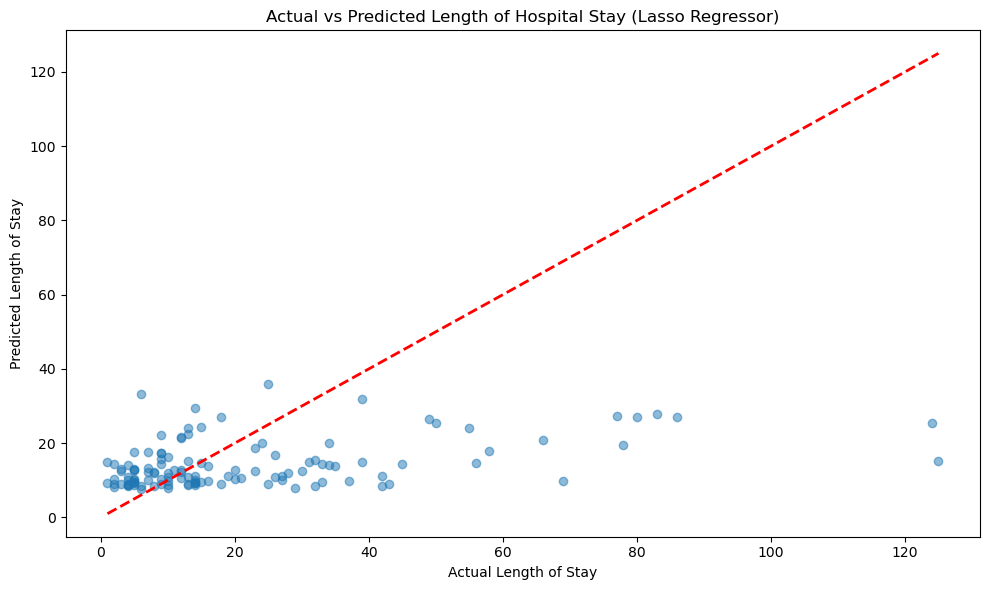

In [76]:
from sklearn.linear_model import Lasso

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'random_state':10,
    'alpha' : 00.006551,
    'fit_intercept' : True,
    'copy_X' : True,
    'max_iter' : 1500,
    'positive' : True
}


# Initialize and train the Light Gradient Boosting Regressor
lasso = Lasso(**params)
lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lasso, "Lasso_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# # Feature importance plot
# feature_importance = lasso.feature_importances_
# sorted_idx = np.argsort(feature_importance)
# plt.figure(figsize=(10, 8))
# plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
# plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
# plt.xlabel('Feature Importance')
# plt.title('Lasso Regressor Feature Importance')
# plt.tight_layout()
# plt.show()

In [77]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow Lasso Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "Lasso_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, lasso.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="Lasso Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'Lasso Regressor model' already exists. Creating a new version of this model...
2025/03/11 12:40:32 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mod

🏃 View run sneaky-skunk-639 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/e3302aa1b9e94a42a5c011483ed275d8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799


Created version '20' of model 'Lasso Regressor model'.


Best alpha from cross-validation: 0.007906
CV Mean Absolute Error: 0.7183 ± 0.0828
CV Root Mean Squared Error: 0.9167 ± 0.0801
CV R-squared Score: 0.0848 ± 0.1030


/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run tasteful-bug-862 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/3227adab8eb642a0887429996b496c3f
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Test Mean Absolute Error: 14.42
Test Root Mean Squared Error: 22.99
Test R-squared Score: 0.0425


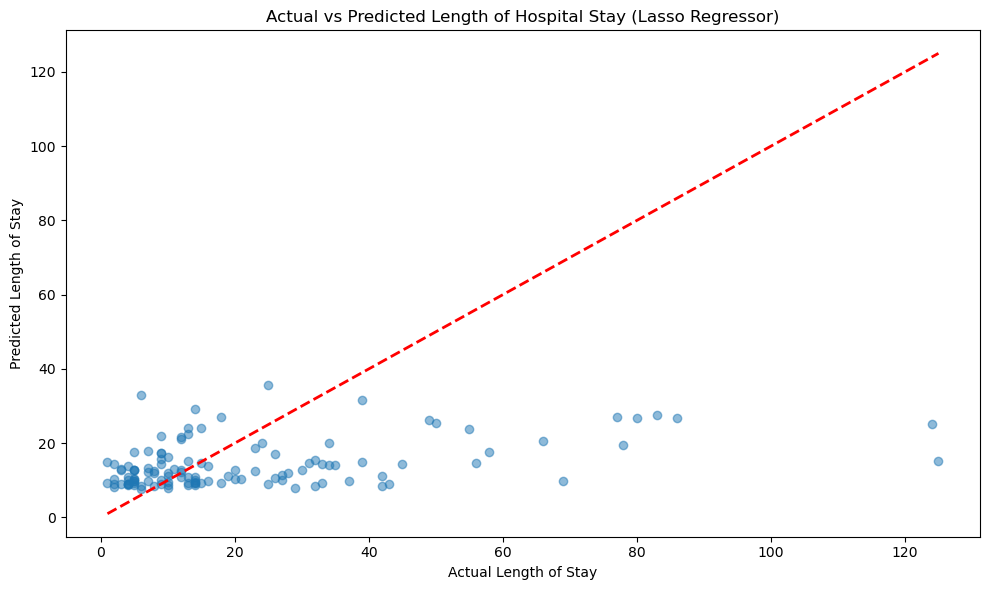

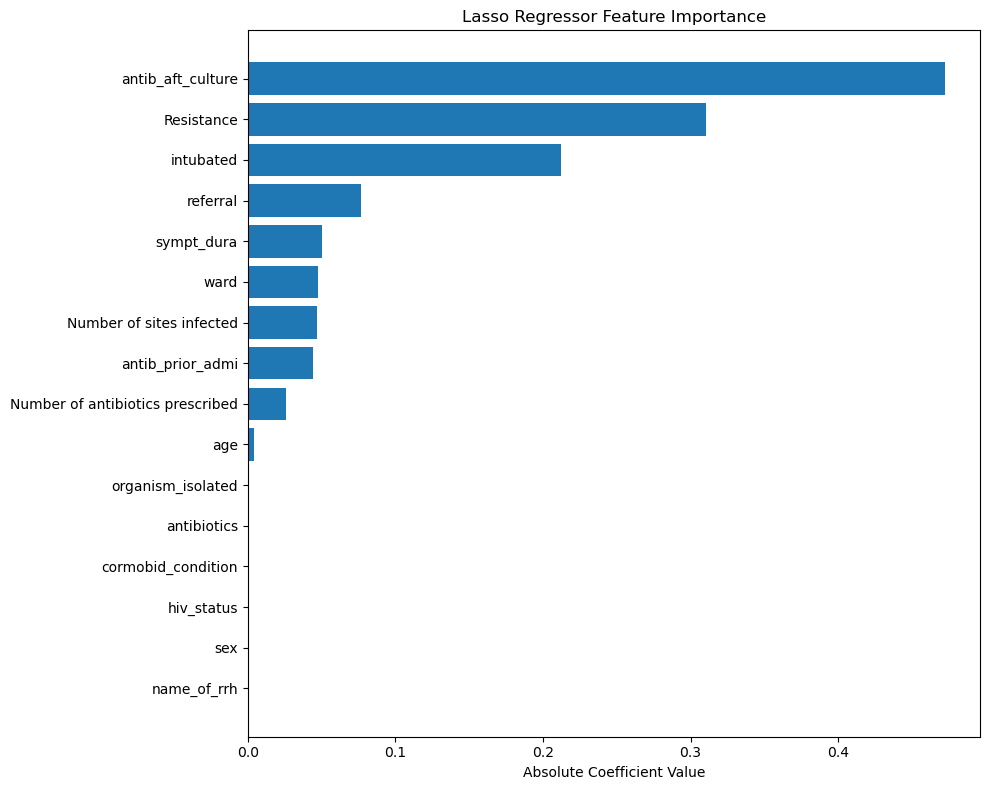

In [78]:
from sklearn.linear_model import Lasso, LassoCV
from sklearn.model_selection import train_test_split, KFold, cross_val_score

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 1. First approach: Cross-validation to find optimal alpha
alphas = np.logspace(-3, 1, 50)  # Range of alphas to test
lasso_cv = LassoCV(
    alphas=alphas,
    cv=25,
    random_state=10,
    max_iter=1500,
    positive=True,
    fit_intercept=True
)

# Fit the model
lasso_cv.fit(X_train, y_train)

# Get the best alpha
best_alpha = lasso_cv.alpha_
print(f"Best alpha from cross-validation: {best_alpha:.6f}")

# 2. Second approach: Cross-validation for model evaluation
params = {
    'random_state': 10,
    'alpha': best_alpha,  # Use the best alpha found
    'fit_intercept': True,
    'copy_X': True,
    'max_iter': 1500,
    'positive': True
}

# Initialize the model with the best parameters
lasso = Lasso(**params)

# Setup cross-validation
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# Cross-validate and evaluate
cv_mae = -cross_val_score(lasso, X_train, y_train, cv=cv, 
                         scoring='neg_mean_absolute_error', n_jobs=-1)
cv_rmse = np.sqrt(-cross_val_score(lasso, X_train, y_train, cv=cv, 
                                 scoring='neg_mean_squared_error', n_jobs=-1))
cv_r2 = cross_val_score(lasso, X_train, y_train, cv=cv, 
                       scoring='r2', n_jobs=-1)

# Print cross-validation results
print(f"CV Mean Absolute Error: {cv_mae.mean():.4f} ± {cv_mae.std():.4f}")
print(f"CV Root Mean Squared Error: {cv_rmse.mean():.4f} ± {cv_rmse.std():.4f}")
print(f"CV R-squared Score: {cv_r2.mean():.4f} ± {cv_r2.std():.4f}")

# Train the final model with the best parameters on the full training set
final_lasso = Lasso(**params)
final_lasso.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = final_lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("best_alpha", best_alpha)
    mlflow.log_metric("cv_mae_mean", cv_mae.mean())
    mlflow.log_metric("cv_rmse_mean", cv_rmse.mean())
    mlflow.log_metric("cv_r2_mean", cv_r2.mean())
    mlflow.log_metric("test_mae", mae)
    mlflow.log_metric("test_mse", mse)
    mlflow.log_metric("test_rmse", rmse)
    mlflow.log_metric("test_r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred_log)
    mlflow.sklearn.log_model(final_lasso, "Lasso_regressor_model", signature=signature)

# Print the test metrics
print(f"Test Mean Absolute Error: {mae:.2f}")
print(f"Test Root Mean Squared Error: {rmse:.2f}")
print(f"Test R-squared Score: {r2:.4f}")

# Scatter plot for predictions vs actual values
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
         [y_test_original.min(), y_test_original.max()],
         'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature importance plot for Lasso using absolute coefficient values
feature_importance = np.abs(final_lasso.coef_)
feature_names = X.columns
sorted_idx = np.argsort(feature_importance)
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), feature_names[sorted_idx])
plt.xlabel('Absolute Coefficient Value')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run marvelous-mole-606 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/675b13e728214310bd173d05c68a6574
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Mean Absolute Error: 14.41
Root Mean Squared Error: 22.96
R-squared Score: 0.0446


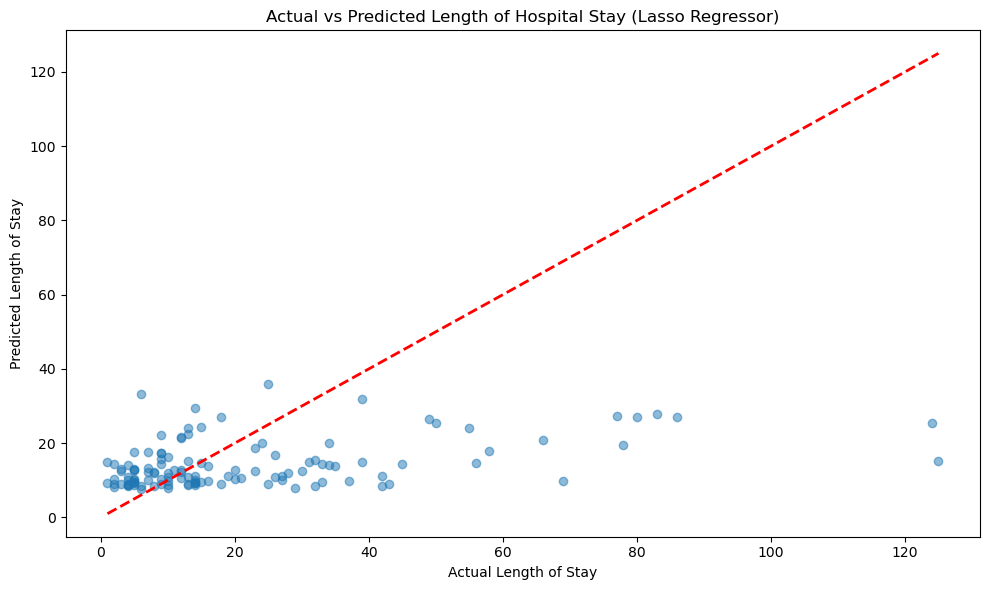

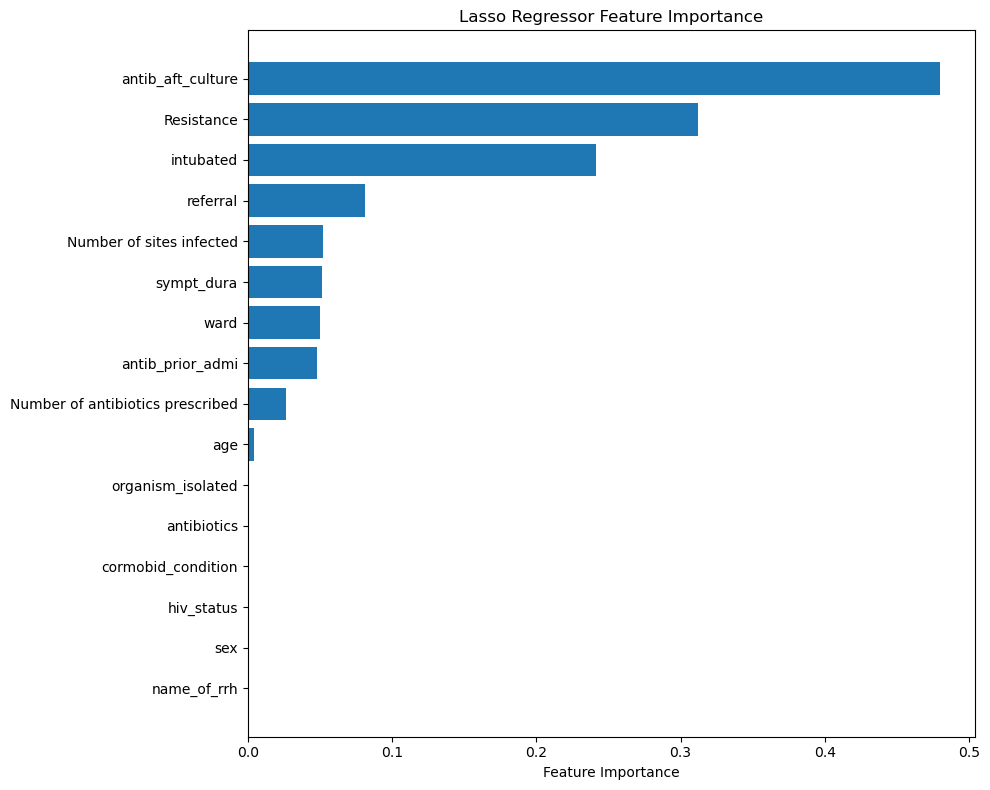

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import mlflow
from mlflow.models.signature import infer_signature

# # Apply log transformation to the target variable
# X = data[['complications', 'Resistance', 'referral', 'antib_prior_admi', 'sympt_dura', 'ward', 'age', 'sex']]
# y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Lasso hyperparameters
params = {
    'random_state': 10,  # Not a parameter for Lasso
    'alpha': 0.006551,
    'fit_intercept': True,
    'max_iter': 1500,
    'positive': True
}

# Initialize and train the Lasso Regressor
lasso = Lasso(**params)
lasso.fit(X_train, y_train)

# Make predictions
y_pred_log = lasso.predict(X_test)
y_pred = np.expm1(y_pred_log)  
y_test_original = np.expm1(y_test)

# Calculate metrics
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(lasso, "Lasso_regressor_model", signature=signature)

# Print metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# Feature Importance Plot for Lasso
feature_importance = np.abs(lasso.coef_)
sorted_idx = np.argsort(feature_importance)

plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Lasso Regressor Feature Importance')
plt.tight_layout()
plt.show()


# KNN Regressor

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


🏃 View run blushing-colt-617 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/191029914f194f498d48fb97cd533bb8
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799
Mean Absolute Error: 14.85
Root Mean Squared Error: 23.57
R-squared Score: -0.0068


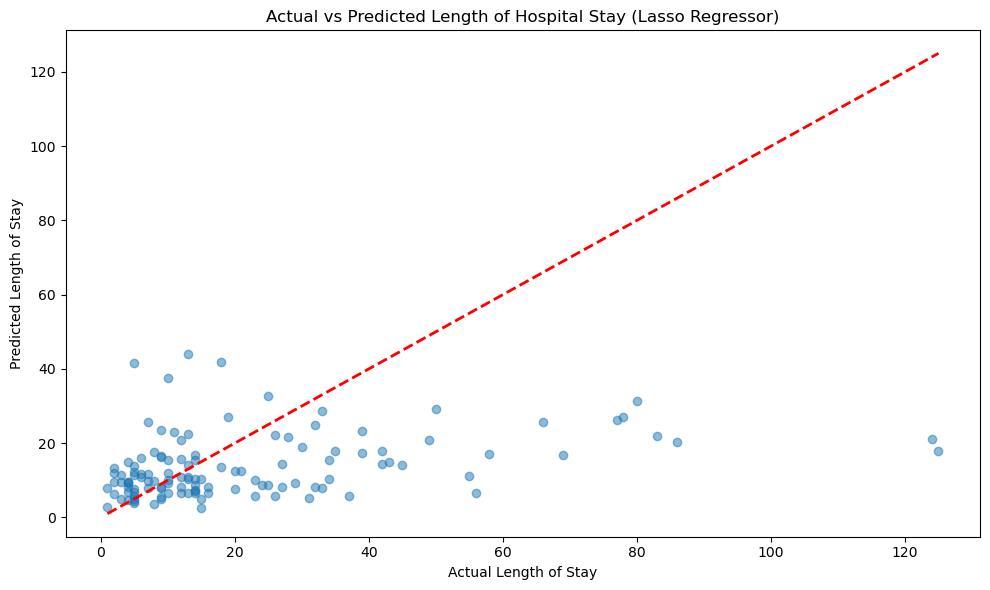

In [80]:
from sklearn.neighbors import KNeighborsRegressor

# Apply log transformation to the target variable
X = data.drop(columns='length_hosp_stay')
y = np.log1p(data['length_hosp_stay'])  # Using log1p to handle zero values

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Define the model hyperparameters for Light Gradient Boosting
params = {
    'n_neighbors': 5,
    'weights': 'distance',
    'algorithm': 'auto',
    'leaf_size': 45,
    'p': 1,
    'metric': 'minkowski'
}


# Initialize and train the Light Gradient Boosting Regressor
knn = KNeighborsRegressor(**params)
knn.fit(X_train, y_train)

# Make predictions and inverse transform them
y_pred_log = knn.predict(X_test)
y_pred = np.expm1(y_pred_log)  # Inverse transform the predictions
y_test_original = np.expm1(y_test)  # Inverse transform the test data

# Calculate metrics on the original scale
mae = mean_absolute_error(y_test_original, y_pred)
mse = mean_squared_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Log the model and metrics with MLflow
with mlflow.start_run():
    mlflow.log_params(params)
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("rmse", rmse)
    mlflow.log_metric("r2", r2)
    
    # Log the model with input and output signatures
    signature = infer_signature(X_train, y_pred)
    mlflow.sklearn.log_model(knn, "KNN_regressor_model", signature=signature)

# Print the metrics
print(f"Mean Absolute Error: {mae:.2f}")
print(f"Root Mean Squared Error: {rmse:.2f}")
print(f"R-squared Score: {r2:.4f}")

# Optional: Create a scatter plot to visualize predictions vs actual values
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(y_test_original, y_pred, alpha=0.5)
plt.plot([y_test_original.min(), y_test_original.max()],
          [y_test_original.min(), y_test_original.max()],
          'r--', lw=2)
plt.xlabel('Actual Length of Stay')
plt.ylabel('Predicted Length of Stay')
plt.title('Actual vs Predicted Length of Hospital Stay (Lasso Regressor)')
plt.tight_layout()
plt.show()

# # Feature importance plot
# feature_importance = knn.feature_importances_
# sorted_idx = np.argsort(feature_importance)
# plt.figure(figsize=(10, 8))
# plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx])
# plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
# plt.xlabel('Feature Importance')
# plt.title('Lasso Regressor Feature Importance')
# plt.tight_layout()
# plt.show()

In [81]:
# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri="http://127.0.0.1:8080")

# Create a new MLflow Experiment
mlflow.set_experiment("MLflow Lasso Regressor model")

# Start an MLflow run
with mlflow.start_run():
    # Log the hyperparameters
    mlflow.log_params(params)

    # Log the loss metric
    mlflow.log_metric("mae", mae)
    mlflow.log_metric("mse", mse)
    mlflow.log_metric("r2", r2)

    # Set a tag that we can use to remind ourselves what this run was for
    mlflow.set_tag("Training Info", "KNN_regressor_model")

    # Infer the model signature
    signature = infer_signature(X_train, knn.predict(X_train))

    # Log the model
    model_info = mlflow.sklearn.log_model(
        sk_model=huber,
        artifact_path="growth",
        signature=signature,
        input_example=X_train,
        registered_model_name="KNN Regressor model",
    )

/home/kyomukama/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:452: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'KNN Regressor model' already exists. Creating a new version of this model...
2025/03/11 12:40:40 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model

🏃 View run bittersweet-frog-822 at: http://127.0.0.1:8080/#/experiments/630657385198661799/runs/671a73f6842d40d98292679480249e2b
🧪 View experiment at: http://127.0.0.1:8080/#/experiments/630657385198661799


Created version '5' of model 'KNN Regressor model'.


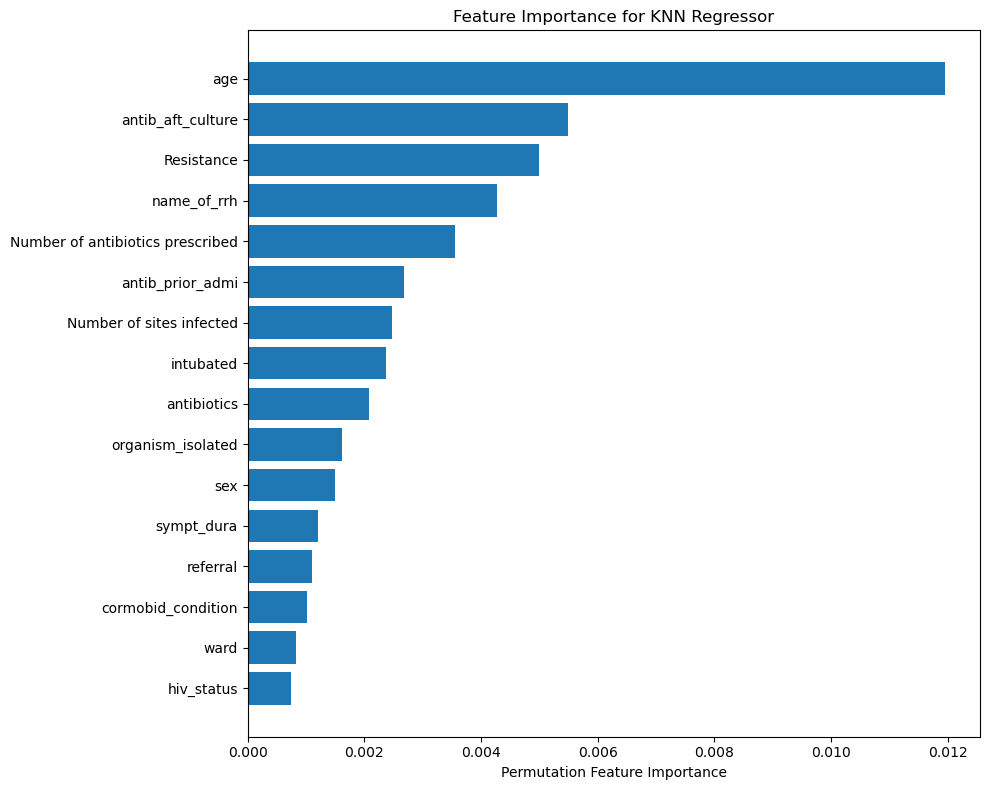

In [82]:
from sklearn.inspection import permutation_importance

import matplotlib.pyplot as plt

# Calculate permutation feature importance
result = permutation_importance(knn, X_test, y_test_original, n_repeats=30, random_state=42, n_jobs=-1)

# Get the importance and sort them
sorted_idx = result.importances_mean.argsort()

# Plot the feature importance
plt.figure(figsize=(10, 8))
plt.barh(range(len(sorted_idx)), result.importances_mean[sorted_idx])
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Permutation Feature Importance')
plt.title('Feature Importance for KNN Regressor')
plt.tight_layout()
plt.show()